In [1]:
from holdout_workflow_comvis import Holdout_Workflow_CV
# from mobilenetv2cbam.mobilenetv2cbam_hilmi import MobileNetV2_CBAM_hilmi
from mobilenetv2.mobilenetv2 import MobileNetV2
from basic_workflow_comvis import Pov2ImageDataset_V4

import torch
from torch.utils.data import DataLoader
from torch import nn
from torch import optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split

import numpy as np

import pandas as pd

from PIL import Image

import matplotlib.pyplot as plt

In [2]:
import time
import joblib
import optuna
from basic_workflow_comvis import DfToDataset

/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

# target_names = {
#   "AF"    :0,
#   "AN"    :1,
#   "DI"    :2,
#   "HA"    :3,
#   "NE"    :4,
#   "SA"    :5,
#   "SU"    :6
# }
target_names = {
  "c0":0,
  "c1":1,
  "c2":2,
  "c3":3,
  "c4":4,
  "c5":5,
  "c6":6,
  "c7":7,
  "c8":8,
  "c9":9
}
# print(device)

workflow = Holdout_Workflow_CV(target_names, device)

Using device: cuda:0


In [4]:

mean = np.array([0.5, 0.5, 0.5])
std = np.array([0.5, 0.5, 0.5])

transform_train = transforms.Compose([
    transforms.Resize(size=(224, 224)),
    transforms.RandomAffine(degrees=(-15, 15), shear=(-15, 15)),

#   transforms.Lambda(lambda img: imgaug_transform.augment_image(np.array(img))),
    transforms.RandomRotation(15),
    transforms.ToTensor(),
    transforms.Normalize(mean,std),
])

transform_test = transforms.Compose([
    transforms.Resize(size=(224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean,std),
])

### Uji Coba

In [ ]:
# # name_file = f"kmu_fed_kfold{n_splits}.{fi}.{epochs}_mobilenetv2_v0.3"
# name_model = "mobilenetv2cbam"
# model = MobileNetV2_CBAM_hilmi(10)
# str_to_num=False
# save_path = f"../hasil/mobilenetv2cbam"

# path_dir = "../resources"
# name_data = "isdds90c_irhv2_holdout_nonpersonsplitv2"
# path = path_dir+"/isdds_skeleton/90c_v2"
# dataset_list = [path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/latih_isdds90c_irhv2.csv",
#                 path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/valid_isdds90c_irhv2.csv",
#                 path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/uji_isdds90c_irhv2.csv",]


# criterion = nn.CrossEntropyLoss()

# optim_params = {}
# optimizer = optim.Adam
# # scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=5, factor=0.5)

# patience = 15#30
# # counter = 0

# # n_splits=5
# epochs=1#50#250#20
# batch_size= 20#8#64#32

# versi = "Adam_default_outchan1280_20batch" #X, coba lr0.001

	Epochs 1
		Best -> epoch: 1
		Training Loss: 1.989
			Training Accuracy: 28.495%
			Training Precision: 27.482%
			Training F1: 27.471%
			Training Recall: 28.495%
		Validation loss: 3.766
			Validation Accuracy: 12.791%
			Validation Precision: 7.055%
			Validation F1: 5.988%
			Validation Recall: 12.791%
		ROC AUC validation: 0.7532441230642726
	Waktu komputasi training: 16.553327322006226 detik
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        52
           1       0.00      0.00      0.00        55
           2       0.00      0.00      0.00        41
           3       0.25      0.02      0.04        46
           4       0.11      0.98      0.21        45
           5       0.00      0.00      0.00        63
           6       0.00      0.00      0.00        43
           7       0.00      0.00      0.00        64
           8       0.25      0.20      0.22        54
           9       0.12      0.19      0.14        53

  

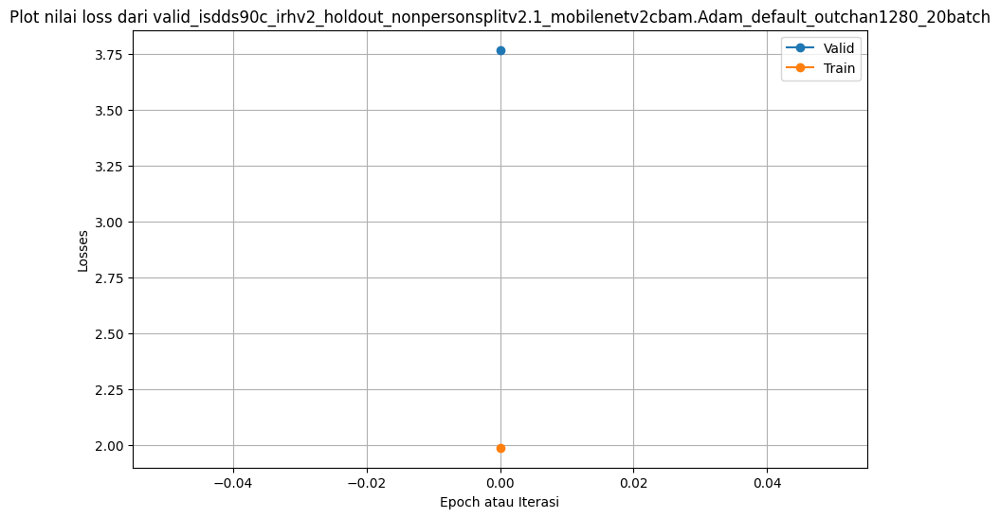

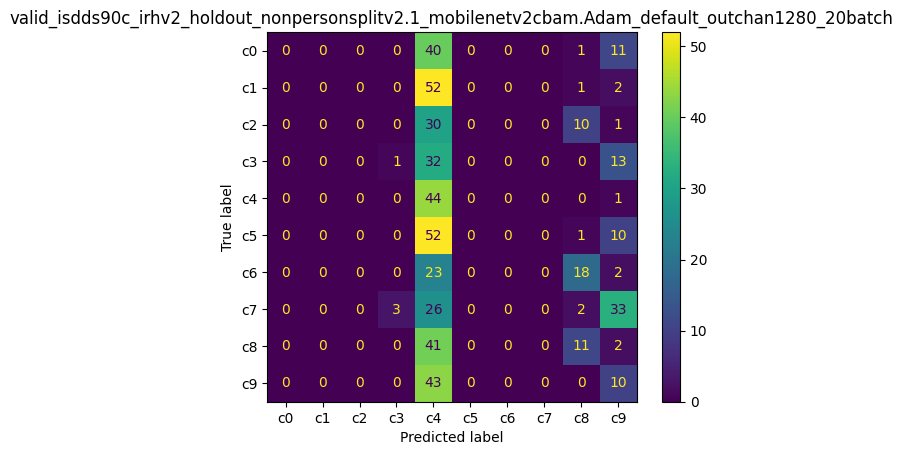

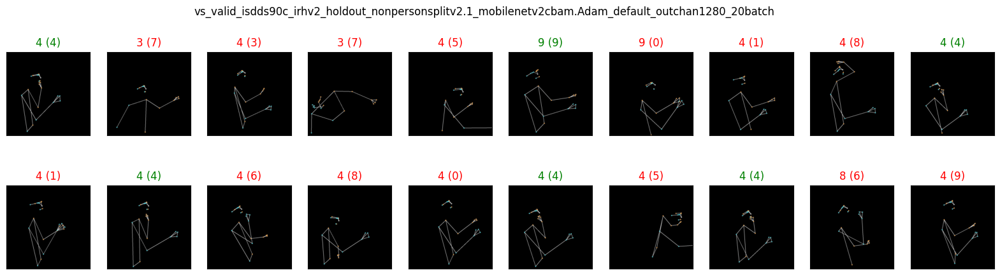

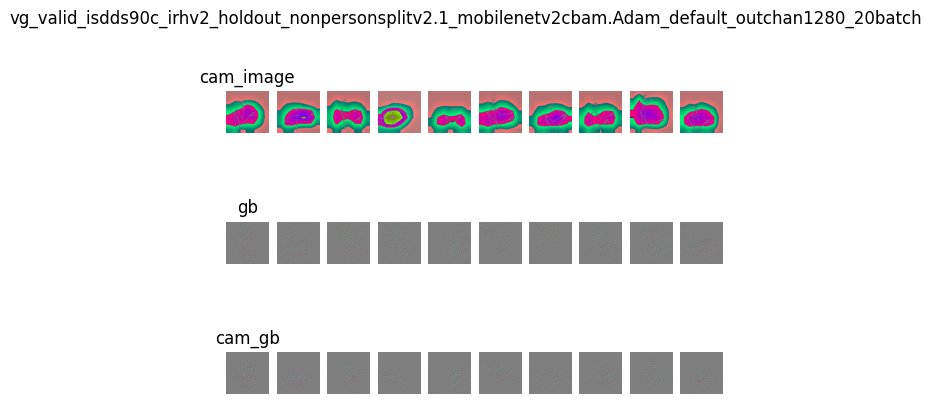

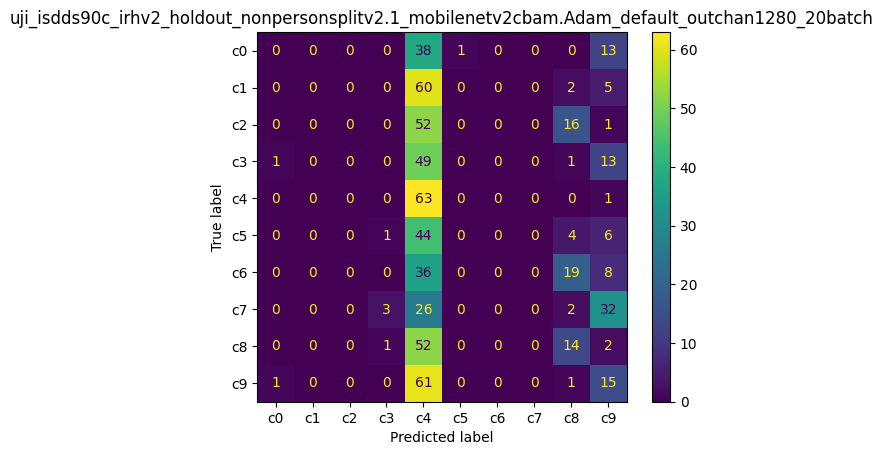

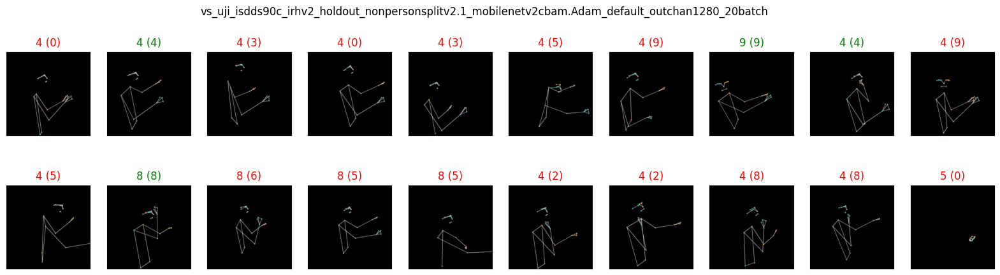

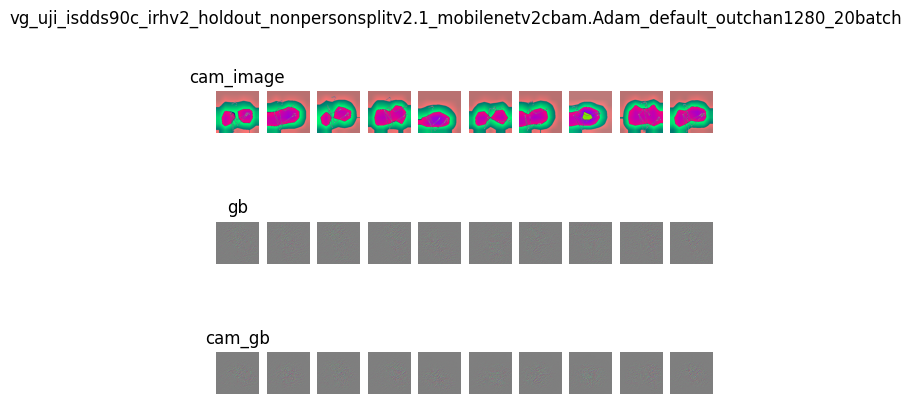

In [6]:
workflow.run_workflow(
    versi=versi, model=model, str_to_num=str_to_num,
    # init_model=init_mobilenetv2(),
    # dataset_const=dataset,
    batch_size=batch_size,
    # n_splits=n_splits,
    epochs=epochs,
    patience=patience,
    # class_names=class_names,
    path=path,
    name_model=name_model,
    name_data=name_data,
    save_path0=save_path,
    criterion_const=criterion,
    optim_const=optimizer, optim_params=optim_params,
    transform_train=transform_train, transform_test=transform_test,
    dataset_list=dataset_list
)


### Sudut 90c versi 2

In [5]:
name_model = "mobilenetv2"
model = MobileNetV2(num_classes=10)
str_to_num=False
save_path = f"../hasil/{name_model}"

path_dir = "../resources"
name_data = "isdds90c_irhv2_holdout_nonpersonsplitv2"
path = path_dir+"/isdds_skeleton/90c_v2"
dataset_list = [path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/latih_isdds90c_irhv2.csv",
                path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/valid_isdds90c_irhv2.csv",
                path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/uji_isdds90c_irhv2.csv",]


criterion = nn.CrossEntropyLoss()

optim_params = {}
optimizer = optim.Adam
# scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=5, factor=0.5)

patience = 15
# counter = 0

# n_splits=5
epochs=50
batch_size= 20

versi = "Adam_default_outchan1280_20batch" #X, coba lr0.001

Folder tersebut sudah ada, yakin tetap melanjutkan fungsi run_workflow()?(y/n)
status use_train:  False
fungsi tetap dijalankan
	Epochs bukan train
		Best -> epoch: bukan train
		Training Loss: 0.475
			Training Accuracy: 84.126%
			Training Precision: 85.197%
			Training F1: 84.222%
			Training Recall: 84.126%
		Validation loss: 0.694
			Validation Accuracy: 81.783%
			Validation Precision: 83.346%
			Validation F1: 82.031%
			Validation Recall: 81.783%
		ROC AUC validation: 0.9750049783074454
	Waktu komputasi training: 9.100520372390747 detik
              precision    recall  f1-score   support

           0       0.80      0.71      0.76        52
           1       0.79      0.69      0.74        55
           2       0.55      0.88      0.67        41
           3       0.79      0.91      0.85        46
           4       0.91      0.89      0.90        45
           5       0.93      0.89      0.91        63
           6       0.82      0.84      0.83        43
           7    

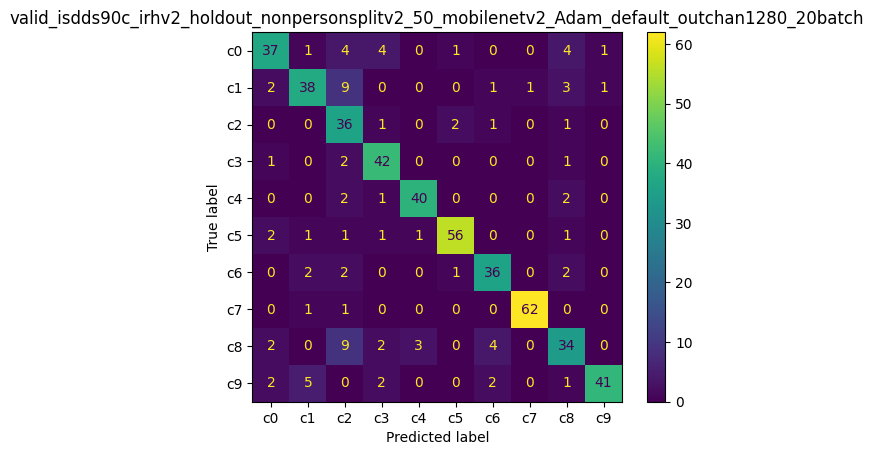

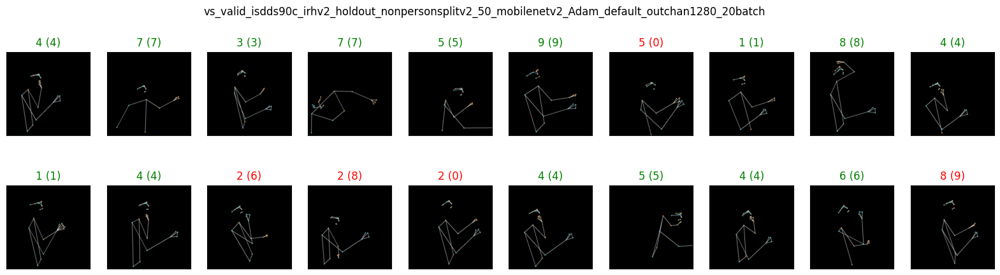

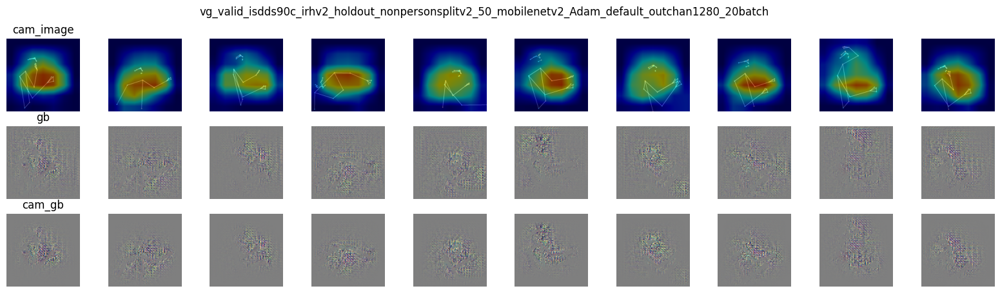

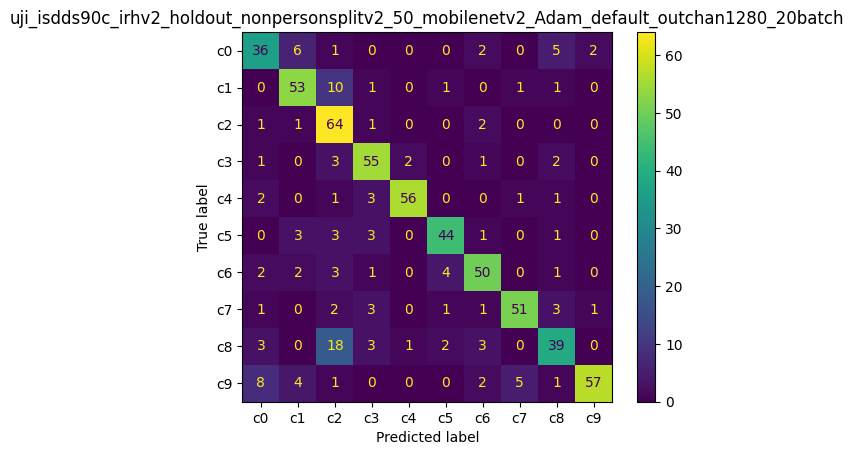

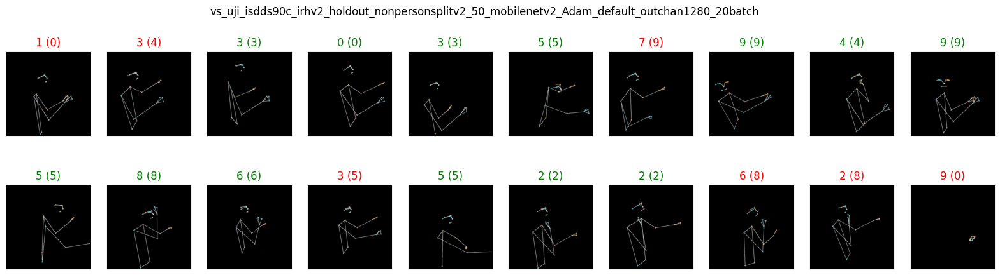

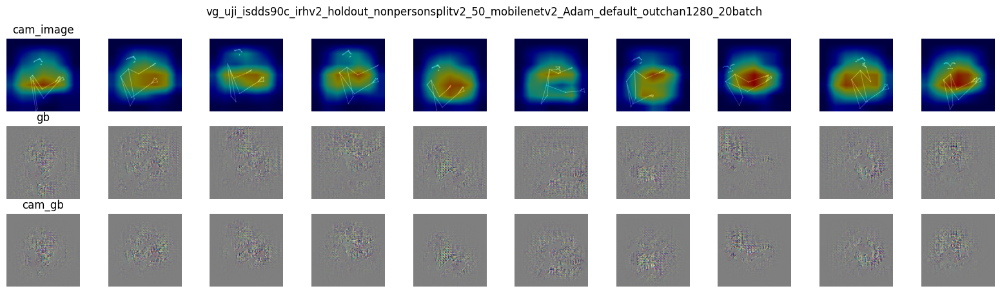

In [8]:
workflow.run_workflow(
    versi=versi, model=model, str_to_num=str_to_num,
    # init_model=init_mobilenetv2(),
    # dataset_const=dataset,
    batch_size=batch_size,
    # n_splits=n_splits,
    epochs=epochs,
    patience=patience,
    # class_names=class_names,
    path=path,
    name_model=name_model,
    name_data=name_data,
    save_path0=save_path,
    criterion_const=criterion,
    optim_const=optimizer, optim_params=optim_params,
    transform_train=transform_train, transform_test=transform_test,
    dataset_list=dataset_list,
    use_train=False
)


	Early stopping triggered at epoch 38
	Epochs 38
		Best -> epoch: 23
		Training Loss: 0.451
			Training Accuracy: 84.709%
			Training Precision: 85.016%
			Training F1: 84.796%
			Training Recall: 84.709%
		Validation loss: 0.694
			Validation Accuracy: 81.783%
			Validation Precision: 83.346%
			Validation F1: 82.031%
			Validation Recall: 81.783%
		ROC AUC validation: 0.9750049783074454
	Waktu komputasi training: 554.5474219322205 detik
              precision    recall  f1-score   support

           0       0.80      0.71      0.76        52
           1       0.79      0.69      0.74        55
           2       0.55      0.88      0.67        41
           3       0.79      0.91      0.85        46
           4       0.91      0.89      0.90        45
           5       0.93      0.89      0.91        63
           6       0.82      0.84      0.83        43
           7       0.98      0.97      0.98        64
           8       0.69      0.63      0.66        54
           9    

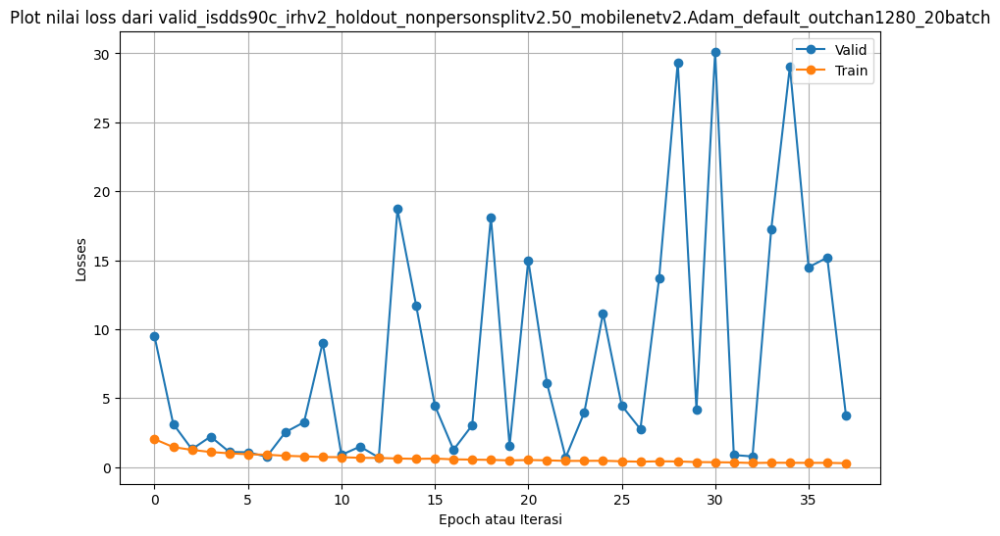

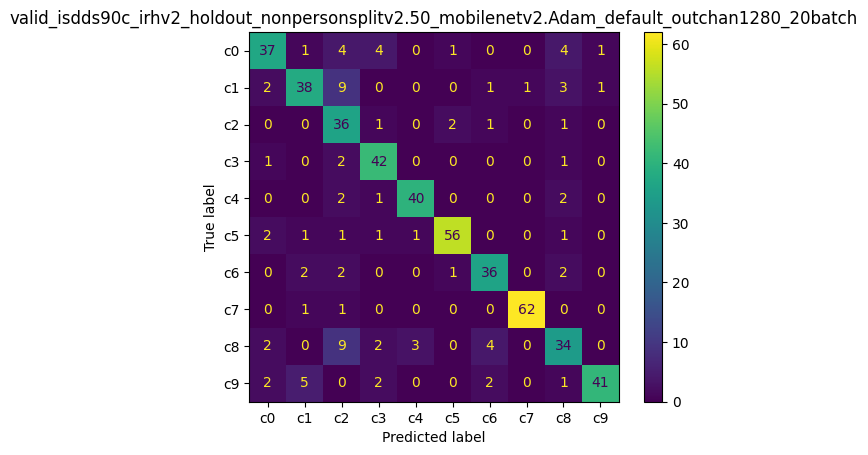

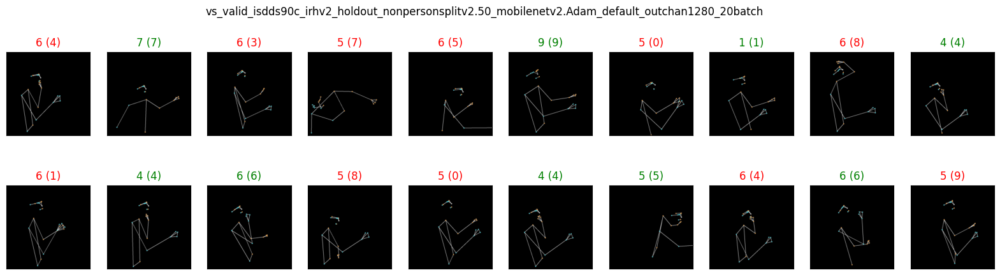

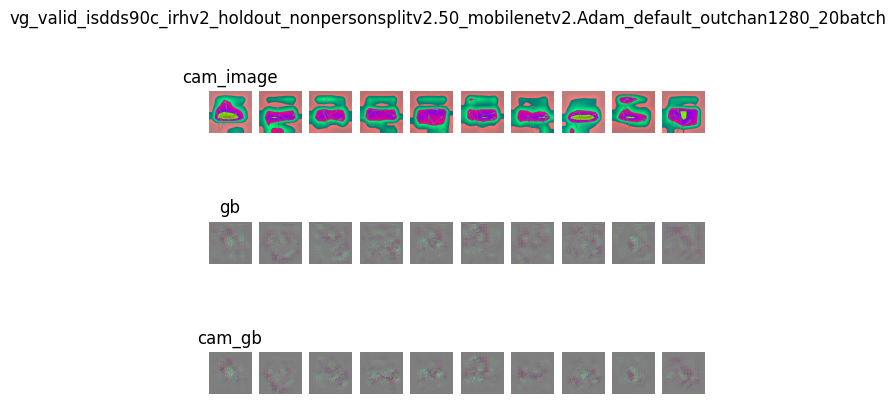

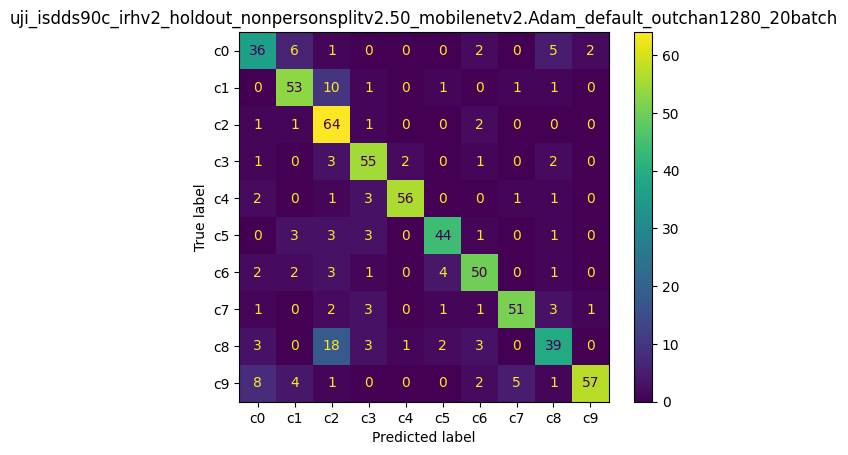

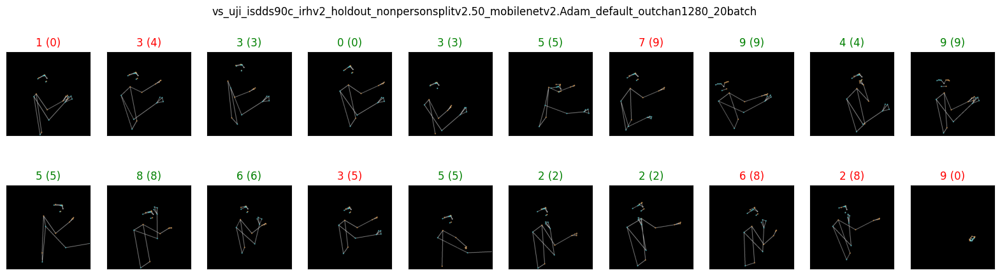

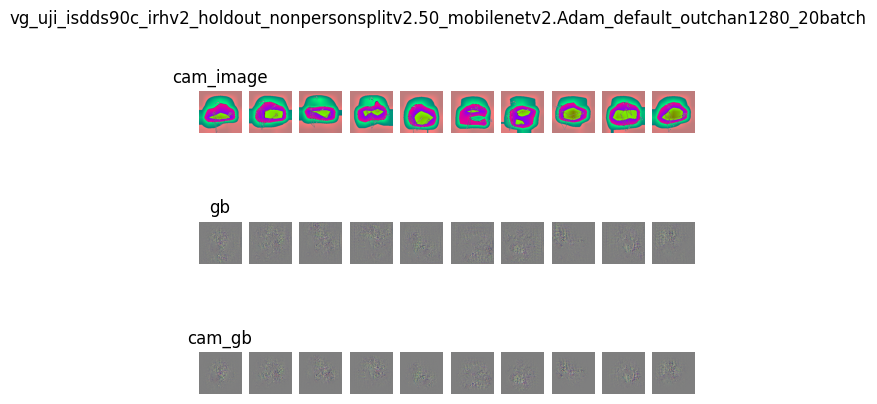

In [6]:
workflow.run_workflow(
    versi=versi, model=model, str_to_num=str_to_num,
    # init_model=init_mobilenetv2(),
    # dataset_const=dataset,
    batch_size=batch_size,
    # n_splits=n_splits,
    epochs=epochs,
    patience=patience,
    # class_names=class_names,
    path=path,
    name_model=name_model,
    name_data=name_data,
    save_path0=save_path,
    criterion_const=criterion,
    optim_const=optimizer, optim_params=optim_params,
    transform_train=transform_train, transform_test=transform_test,
    dataset_list=dataset_list
)


#### optuna berdasarkan akurasi

In [5]:
name_model = "mobilenetv2"
model = MobileNetV2(num_classes=10)
str_to_num=False
save_path = f"../hasil/{name_model}"

path_dir = "../resources"
name_data = "isdds90c_irhv2_holdout_nonpersonsplitv2"
path = path_dir+"/isdds_skeleton/90c_v2"
dataset_list = [path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/latih_isdds90c_irhv2.csv",
                path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/valid_isdds90c_irhv2.csv",
                path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/uji_isdds90c_irhv2.csv",]


# criterion = nn.CrossEntropyLoss()

# optim_params = {}
# optimizer = optim.Adam
# # scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=5, factor=0.5)

# patience = 15
# # counter = 0

# # n_splits=5
epochs=50
# batch_size= 20

# versi = "Adam_default_outchan1280_20batch" #X, coba lr0.001

In [7]:
# import time
# class_names = {
#   "AN": 0,
#   "DI": 1,
#   "FE": 2,
#   "HA": 3,
#   "SA": 4,
#   "SU": 5
# }

def objective_momen(trial):
    torch.cuda.empty_cache()
    
    # Generate the model.
    model = MobileNetV2(num_classes=10).to(device) #phase3
    # model = MobileNetV2_CBAM_hilmi_optuna(trial).to(device)

    # Generate the optimizers.
    # epochs = trial.suggest_int("epochs", 15, 30, log=True) # phase 2
    epochs = 20
    # batch = trial.suggest_int("batch_size", 16, 64, step=16)
    batch = trial.suggest_int("batch_size", 8, 32, log=True) # phase 2
    
    # lr = trial.suggest_float("lr", 0.00001, 0.01, log=True)  # phase2
    lr = trial.suggest_float("lr", 0.0001, 0.0100, log=True)  # phase3

    wdecay = trial.suggest_float("weight_decay", 0.0001, 0.0100, log=True) #phase2
    momen = trial.suggest_float("momentum", 0.8, 0.99, log=True) #phase 2
    # optimizer_name = trial.suggest_categorical("optimizer", ["Adam", "AdamW", "RMSprop", "SGD"]) # phase2
    optimizer_name = trial.suggest_categorical("optimizer", ["SGD", "Adam"]) #
    if (optimizer_name == "Adam") or (optimizer_name == "AdamW"):
        optimizer = getattr(optim, optimizer_name)(model.parameters(), lr=lr, weight_decay=wdecay)
    else:
        optimizer = getattr(optim, optimizer_name)(model.parameters(), lr=lr, weight_decay=wdecay, momentum=momen)
    # optimizer = getattr(optim, optimizer_name)(model.parameters(), lr=lr, weight_decay=wdecay)
    
    criterion = nn.CrossEntropyLoss()
    # alternative version
    # optimizer = trial.suggest_categorical("optimizer", [optim.Adam, optim.RMSprop, optim.SGD])

    # Get the dataset.
    # valid_dataset = pd.read_csv("kmufed_nonperson_holdout_valid.csv")
    # train_dataset = pd.read_csv("kmufed_nonperson_holdout_latih.csv")
    # valid_data = DfToDataset(valid_dataset, path, transform_test)
    # train_data = DfToDataset(train_dataset, path, transform_test)
    # train_loader = DataLoader(train_data, batch_size=batch, shuffle=False)
    # valid_loader = DataLoader(valid_data, batch_size=batch, shuffle=False)

    test_dataset = pd.read_csv(dataset_list[1])
    test_data = DfToDataset(test_dataset, path, transform_test)
    test_loader = DataLoader(test_data, batch_size=batch, shuffle=False, num_workers=1)

    ### kfold 5.1 non person ###
    # dataset_const = pd.read_csv("kmufed_latih.csv")
    # n_splits=5
    # fi=1
    # name_file_index = f"kmu_fed_kfold{n_splits}.{fi}"

    # kfold_dir = "kfold_data_nonperson"
    # train_index = pd.read_csv(f"{kfold_dir}/latih_{name_file_index}.csv")['idx_train'].values
    # test_index = pd.read_csv(f"{kfold_dir}/valid_{name_file_index}.csv")['idx_valid'].values

    # train_groups = pd.read_csv(f"{kfold_dir}/latih_{name_file_index}.csv")['groups_train'].values#groups[train_index]
    # test_groups = pd.read_csv(f"{kfold_dir}/valid_{name_file_index}.csv")['groups_valid'].values#groups[test_index]

    # train_dataset, val_dataset = dataset_const.iloc[ train_index, :], dataset_const.iloc[ test_index, :]
    # path = "kmufed"
    train_dataset = pd.read_csv(dataset_list[0])
    train_data = DfToDataset(train_dataset, path, transform_train)
    # valid_data = DfToDataset(val_dataset, path, transform_test)

    # print( next(iter(train_data)))
    # plt.imshow( next(iter(train_data))[0].view(224, 224, 3) )
    # break

    # batch_size = 8  # Sesuaikan dengan kebutuhan Anda
    train_loader = DataLoader(train_data, batch_size=batch, shuffle=False, num_workers=9)
    # valid_loader = DataLoader(valid_data, batch_size=batch_size, shuffle=False)
    ### ### ### ### ### ### ###
    # best_acc = 0.0
    # best_epoch = 0
    start = 0
    # Training of the model.
    for epoch in range(epochs):
        start = time.time()
        model.train()
        for batch_idx, (data, target) in enumerate(train_loader):
            if str_to_num:
                target = torch.from_numpy( np.array([target_names[label] for label in target]) )
            # Limiting training data for faster epochs.
            # if batch_idx * batch_size >= n_train_examples:
            #     break

            data, target = data.to(device), target.to(device)

            output = model(data)
            loss = criterion(output, target)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # Validation of the model.
        model.eval()
        correct = 0
        with torch.no_grad():
            for batch_idx, (data, target) in enumerate(test_loader):
                if str_to_num:
                    target = torch.from_numpy( np.array([target_names[label] for label in target]) )
                # Limiting validation data.
                # if batch_idx * batch_size >= n_valid_examples:
                #     break
                data, target = data.to(device), target.to(device)
                output = model(data)
                # Get the index of the max log-probability.
                pred = output.argmax(dim=1, keepdim=True)
                correct += pred.eq(target.view_as(pred)).sum().item()

        accuracy = correct / len(test_loader.dataset)

        # report back to Optuna how far it is (epoch-wise) into the trial and how well it is doing (accuracy)
        trial.report(accuracy, epoch)  #phase 3, 4

        # # then, Optuna can decide if the trial should be pruned
        # # Handle pruning based on the intermediate value.
        if trial.should_prune(): #phase 3,4 
            raise optuna.exceptions.TrialPruned()
        
        # if round(accuracy, 2) >= round(best_acc, 2):
        #     best_acc = accuracy
        #     best_epoch = epoch
        
    end = time.time() - start
    # test_dataset = pd.read_csv("kmufed_uji.csv")
    # test_data = DfToDataset(test_dataset, path, transform_test)
    # test_loader = DataLoader(test_data, batch_size=batch, shuffle=False)

    # test_correct = 0
    # model.eval()
    # with torch.no_grad():
    #     for batch_idx, (data, target) in enumerate(test_loader):
    #         target = torch.from_numpy( np.array([class_names[label] for label in target]) )
    #         # Limiting validation data.
    #         # if batch_idx * batch_size >= n_valid_examples:
    #         #     break
    #         data, target = data.to(device), target.to(device)
    #         output = model(data)
    #         # Get the index of the max log-probability.
    #         pred = output.argmax(dim=1, keepdim=True)
    #         test_correct += pred.eq(target.view_as(pred)).sum().item()

    test_accuracy = accuracy#test_correct / len(test_loader.dataset)

    trial.report(test_accuracy, epoch)  

    # then, Optuna can decide if the trial should be pruned
    # Handle pruning based on the intermediate value.
    if trial.should_prune():
        raise optuna.exceptions.TrialPruned()

    del model
    torch.cuda.empty_cache()

    # print(f"\tbest_epoch: {best_epoch}")
    print(f"\tdurasi (detik): {end}")
    # return best_acc
    return test_accuracy

In [ ]:
# now we can run the experiment
name_file = f"{name_data}.{epochs}_{name_model}"#.{versi}"
n_trials=125

sampler = optuna.samplers.TPESampler()
study = optuna.create_study(study_name=f"optuna{n_trials}_{name_file}"
                            , direction="maximize", 
                            sampler=sampler,
                            # storage=f'sqlite:///../hasil/{name_model}/optuna{n_trials}_{name_file}.db')
                            storage=f'sqlite:///optuna{n_trials}_{name_file}.db',)
                            # load_if_exists=True)
study.optimize(objective_momen, n_trials=n_trials)

pruned_trials = [t for t in study.trials if t.state == optuna.trial.TrialState.PRUNED]
complete_trials = [t for t in study.trials if t.state == optuna.trial.TrialState.COMPLETE]

print("Study statistics: ")
print("  Number of finished trials: ", len(study.trials))
print("  Number of pruned trials: ", len(pruned_trials))
print("  Number of complete trials: ", len(complete_trials))

print("Best trial:")
trial = study.best_trial

print("  Value: ", trial.value)

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2025-10-10 17:35:57,827] A new study created in RDB with name: optuna125_isdds90c_irhv2_holdout_nonpersonsplitv2.50_mobilenetv2
/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 17:40:32,868] Trial 0 finished with value: 0.7945736434108527 and parameters: {'batch_size': 28, 'lr': 0.0023353355248727174, 'weight_decay': 0.008073124259197581, 'momentum': 0.8299849415429318, 'optimizer': 'SGD'}. Best is trial 0 with value: 0.7945736434108527.


	durasi (detik): 13.979840755462646


/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 17:45:25,359] Trial 1 finished with value: 0.14728682170542637 and parameters: {'batch_size': 20, 'lr': 0.006499762162451651, 'weight_decay': 0.0032288096659692507, 'momentum': 0.8799793090457727, 'optimizer': 'Adam'}. Best is trial 0 with value: 0.7945736434108527.


	durasi (detik): 14.431719541549683


/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 17:50:21,307] Trial 2 finished with value: 0.10271317829457365 and parameters: {'batch_size': 13, 'lr': 0.0012436653151585335, 'weight_decay': 0.00010012835181267974, 'momentum': 0.8657603366652307, 'optimizer': 'SGD'}. Best is trial 0 with value: 0.7945736434108527.


	durasi (detik): 14.860659122467041


/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 17:55:22,100] Trial 3 finished with value: 0.25387596899224807 and parameters: {'batch_size': 25, 'lr': 0.008902995391493926, 'weight_decay': 0.00010310852285486778, 'momentum': 0.8952412379941338, 'optimizer': 'SGD'}. Best is trial 0 with value: 0.7945736434108527.


	durasi (detik): 15.062601089477539


/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 18:00:14,370] Trial 4 finished with value: 0.20736434108527133 and parameters: {'batch_size': 28, 'lr': 0.0015023714408731706, 'weight_decay': 0.001430519262197083, 'momentum': 0.9758983980428347, 'optimizer': 'Adam'}. Best is trial 0 with value: 0.7945736434108527.


	durasi (detik): 14.789203643798828


/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 18:05:16,939] Trial 5 finished with value: 0.5658914728682171 and parameters: {'batch_size': 22, 'lr': 0.0016740556647366098, 'weight_decay': 0.00010180418380747924, 'momentum': 0.8846819519413869, 'optimizer': 'Adam'}. Best is trial 0 with value: 0.7945736434108527.


	durasi (detik): 15.07807970046997


[I 2025-10-10 18:05:32,133] Trial 6 pruned. 
[I 2025-10-10 18:05:46,940] Trial 7 pruned. 
[I 2025-10-10 18:06:02,040] Trial 8 pruned. 
/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 18:11:02,551] Trial 9 finished with value: 0.10271317829457365 and parameters: {'batch_size': 23, 'lr': 0.0003469847142120758, 'weight_decay': 0.0007079098392509684, 'momentum': 0.8701503512667124, 'optimizer': 'Adam'}. Best is trial 0 with value: 0.7945736434108527.


	durasi (detik): 15.06689977645874


[I 2025-10-10 18:11:18,264] Trial 10 pruned. 
[I 2025-10-10 18:11:33,679] Trial 11 pruned. 
[I 2025-10-10 18:11:48,965] Trial 12 pruned. 
[I 2025-10-10 18:12:49,518] Trial 13 pruned. 
[I 2025-10-10 18:13:04,923] Trial 14 pruned. 
[I 2025-10-10 18:13:20,245] Trial 15 pruned. 
[I 2025-10-10 18:13:35,530] Trial 16 pruned. 
[I 2025-10-10 18:13:51,233] Trial 17 pruned. 
[I 2025-10-10 18:14:06,387] Trial 18 pruned. 
/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 18:19:02,275] Trial 19 finished with value: 0.13953488372093023 and parameters: {'batch_size': 32, 'lr': 0.0019816400129999464, 'weight_decay': 0.0005104650079068578, 'momentum': 0.8235014212744124, 'optimizer': 'Adam'}. Best is trial 0 with value: 0.7945736434108527.


	durasi (detik): 14.65509843826294


[I 2025-10-10 18:19:17,145] Trial 20 pruned. 
[I 2025-10-10 18:19:32,039] Trial 21 pruned. 
[I 2025-10-10 18:19:46,986] Trial 22 pruned. 
[I 2025-10-10 18:20:01,809] Trial 23 pruned. 
[I 2025-10-10 18:20:16,573] Trial 24 pruned. 
[I 2025-10-10 18:20:31,320] Trial 25 pruned. 
/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 18:25:31,175] Trial 26 finished with value: 0.7558139534883721 and parameters: {'batch_size': 16, 'lr': 0.002515143581188516, 'weight_decay': 0.0008744282229312759, 'momentum': 0.9111166568369787, 'optimizer': 'Adam'}. Best is trial 0 with value: 0.7945736434108527.


	durasi (detik): 14.99515700340271


/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 18:30:42,276] Trial 27 finished with value: 0.11434108527131782 and parameters: {'batch_size': 11, 'lr': 0.0022441105985295732, 'weight_decay': 0.000914332731389282, 'momentum': 0.9079191347538339, 'optimizer': 'Adam'}. Best is trial 0 with value: 0.7945736434108527.


	durasi (detik): 15.434232473373413


/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 18:35:45,553] Trial 28 finished with value: 0.6414728682170543 and parameters: {'batch_size': 15, 'lr': 0.0007271990468045525, 'weight_decay': 0.0014486630948221347, 'momentum': 0.8284307226524881, 'optimizer': 'Adam'}. Best is trial 0 with value: 0.7945736434108527.


	durasi (detik): 15.18935775756836


[I 2025-10-10 18:36:00,854] Trial 29 pruned. 
[I 2025-10-10 18:36:16,630] Trial 30 pruned. 
[I 2025-10-10 18:36:32,059] Trial 31 pruned. 
[I 2025-10-10 18:37:47,972] Trial 32 pruned. 
[I 2025-10-10 18:38:03,196] Trial 33 pruned. 
[I 2025-10-10 18:38:18,173] Trial 34 pruned. 
[I 2025-10-10 18:38:33,698] Trial 35 pruned. 
[I 2025-10-10 18:38:48,829] Trial 36 pruned. 
/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 18:43:41,666] Trial 37 finished with value: 0.8391472868217055 and parameters: {'batch_size': 12, 'lr': 0.0002464611134002072, 'weight_decay': 0.003174735064998515, 'momentum': 0.9099636145589376, 'optimizer': 'Adam'}. Best is trial 37 with value: 0.8391472868217055.


	durasi (detik): 14.429409742355347


/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 18:48:35,659] Trial 38 finished with value: 0.7926356589147286 and parameters: {'batch_size': 8, 'lr': 0.00014251500359612377, 'weight_decay': 0.003000274458685436, 'momentum': 0.9070086966042644, 'optimizer': 'Adam'}. Best is trial 37 with value: 0.8391472868217055.


	durasi (detik): 14.693416833877563


/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 18:53:28,635] Trial 39 finished with value: 0.29457364341085274 and parameters: {'batch_size': 8, 'lr': 0.00010060778597407849, 'weight_decay': 0.0028995538745571307, 'momentum': 0.9067625957229166, 'optimizer': 'Adam'}. Best is trial 37 with value: 0.8391472868217055.


	durasi (detik): 14.55809473991394


[I 2025-10-10 18:53:43,139] Trial 40 pruned. 
/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 18:58:36,283] Trial 41 finished with value: 0.7751937984496124 and parameters: {'batch_size': 8, 'lr': 0.00021106547403436203, 'weight_decay': 0.002520597872436153, 'momentum': 0.8978686704950838, 'optimizer': 'Adam'}. Best is trial 37 with value: 0.8391472868217055.


	durasi (detik): 14.759052276611328


[I 2025-10-10 18:58:50,990] Trial 42 pruned. 
[I 2025-10-10 18:59:05,748] Trial 43 pruned. 
/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 19:03:53,841] Trial 44 finished with value: 0.7403100775193798 and parameters: {'batch_size': 12, 'lr': 0.00014057123934010365, 'weight_decay': 0.0017511440373955511, 'momentum': 0.9376096004566369, 'optimizer': 'Adam'}. Best is trial 37 with value: 0.8391472868217055.


	durasi (detik): 14.348058462142944


[I 2025-10-10 19:04:08,374] Trial 45 pruned. 
/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 19:09:02,290] Trial 46 finished with value: 0.10271317829457365 and parameters: {'batch_size': 8, 'lr': 0.0004595815514235904, 'weight_decay': 0.001105689211783812, 'momentum': 0.9859989190841736, 'optimizer': 'Adam'}. Best is trial 37 with value: 0.8391472868217055.


	durasi (detik): 14.74090313911438


[I 2025-10-10 19:09:16,992] Trial 47 pruned. 
/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 19:14:04,391] Trial 48 finished with value: 0.7926356589147286 and parameters: {'batch_size': 12, 'lr': 0.00031556126427990727, 'weight_decay': 0.006896207039282898, 'momentum': 0.9130653932387531, 'optimizer': 'Adam'}. Best is trial 37 with value: 0.8391472868217055.


	durasi (detik): 14.370862007141113


[I 2025-10-10 19:14:18,884] Trial 49 pruned. 
[I 2025-10-10 19:14:33,605] Trial 50 pruned. 
[I 2025-10-10 19:14:47,890] Trial 51 pruned. 
[I 2025-10-10 19:15:02,564] Trial 52 pruned. 
/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 19:19:46,493] Trial 53 finished with value: 0.7131782945736435 and parameters: {'batch_size': 14, 'lr': 0.0003943235874159519, 'weight_decay': 0.006140108950514935, 'momentum': 0.9164081509562907, 'optimizer': 'Adam'}. Best is trial 37 with value: 0.8391472868217055.


	durasi (detik): 14.08668851852417


[I 2025-10-10 19:20:00,755] Trial 54 pruned. 
[I 2025-10-10 19:20:15,080] Trial 55 pruned. 
[I 2025-10-10 19:20:29,397] Trial 56 pruned. 
[I 2025-10-10 19:20:43,427] Trial 57 pruned. 
/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 19:25:33,089] Trial 58 finished with value: 0.7926356589147286 and parameters: {'batch_size': 10, 'lr': 0.0003531954680665998, 'weight_decay': 0.006625270792573371, 'momentum': 0.9091641708776914, 'optimizer': 'Adam'}. Best is trial 37 with value: 0.8391472868217055.


	durasi (detik): 14.615100145339966


[I 2025-10-10 19:25:47,448] Trial 59 pruned. 
[I 2025-10-10 19:26:02,306] Trial 60 pruned. 
[I 2025-10-10 19:26:16,839] Trial 61 pruned. 
[I 2025-10-10 19:26:31,846] Trial 62 pruned. 
[I 2025-10-10 19:26:46,282] Trial 63 pruned. 
[I 2025-10-10 19:27:00,644] Trial 64 pruned. 
[I 2025-10-10 19:27:14,420] Trial 65 pruned. 
/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 19:31:57,223] Trial 66 finished with value: 0.75 and parameters: {'batch_size': 16, 'lr': 0.00020982525119565414, 'weight_decay': 0.006226761037421154, 'momentum': 0.944067808454731, 'optimizer': 'Adam'}. Best is trial 37 with value: 0.8391472868217055.


	durasi (detik): 14.29958963394165


[I 2025-10-10 19:32:11,517] Trial 67 pruned. 
[I 2025-10-10 19:34:07,953] Trial 68 pruned. 
[I 2025-10-10 19:34:22,508] Trial 69 pruned. 
[I 2025-10-10 19:34:36,591] Trial 70 pruned. 
[I 2025-10-10 19:34:50,904] Trial 71 pruned. 
[I 2025-10-10 19:35:05,090] Trial 72 pruned. 
[I 2025-10-10 19:35:19,410] Trial 73 pruned. 
[I 2025-10-10 19:35:33,709] Trial 74 pruned. 
[I 2025-10-10 19:35:48,011] Trial 75 pruned. 
[I 2025-10-10 19:36:02,142] Trial 76 pruned. 
[I 2025-10-10 19:36:44,511] Trial 77 pruned. 
[I 2025-10-10 19:36:58,389] Trial 78 pruned. 
[I 2025-10-10 19:37:12,696] Trial 79 pruned. 
[I 2025-10-10 19:37:27,211] Trial 80 pruned. 
[I 2025-10-10 19:37:41,234] Trial 81 pruned. 
[I 2025-10-10 19:37:55,836] Trial 82 pruned. 
[I 2025-10-10 19:38:09,876] Trial 83 pruned. 
[I 2025-10-10 19:38:24,152] Trial 84 pruned. 
[I 2025-10-10 19:38:39,017] Trial 85 pruned. 
[I 2025-10-10 19:38:53,309] Trial 86 pruned. 
[I 2025-10-10 19:39:07,599] Trial 87 pruned. 
[I 2025-10-10 19:39:21,879] Trial 

	durasi (detik): 14.36437463760376


[I 2025-10-10 19:45:55,430] Trial 91 pruned. 
[I 2025-10-10 19:46:10,443] Trial 92 pruned. 
[I 2025-10-10 19:46:25,125] Trial 93 pruned. 
[I 2025-10-10 19:46:39,598] Trial 94 pruned. 
[I 2025-10-10 19:46:54,259] Trial 95 pruned. 
[I 2025-10-10 19:47:38,519] Trial 96 pruned. 
[I 2025-10-10 19:47:52,478] Trial 97 pruned. 
[I 2025-10-10 19:48:06,694] Trial 98 pruned. 
[I 2025-10-10 19:48:21,302] Trial 99 pruned. 
/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 19:53:05,240] Trial 100 finished with value: 0.7790697674418605 and parameters: {'batch_size': 17, 'lr': 0.0008041533558364342, 'weight_decay': 0.0008098495508537763, 'momentum': 0.8930846152733944, 'optimizer': 'Adam'}. Best is trial 37 with value: 0.8391472868217055.


	durasi (detik): 14.105531930923462


/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 19:57:47,005] Trial 101 finished with value: 0.14147286821705427 and parameters: {'batch_size': 16, 'lr': 0.0006528923513000681, 'weight_decay': 0.0008069165933619926, 'momentum': 0.89462765387403, 'optimizer': 'Adam'}. Best is trial 37 with value: 0.8391472868217055.


	durasi (detik): 14.059317111968994


[I 2025-10-10 19:58:01,198] Trial 102 pruned. 
/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 20:02:46,449] Trial 103 finished with value: 0.6356589147286822 and parameters: {'batch_size': 13, 'lr': 0.0008527156829449274, 'weight_decay': 0.0011226896107768894, 'momentum': 0.9027631261059387, 'optimizer': 'Adam'}. Best is trial 37 with value: 0.8391472868217055.


	durasi (detik): 14.305469274520874


[I 2025-10-10 20:03:00,641] Trial 104 pruned. 
[I 2025-10-10 20:03:43,591] Trial 105 pruned. 
[I 2025-10-10 20:03:57,967] Trial 106 pruned. 
[I 2025-10-10 20:04:11,903] Trial 107 pruned. 
[I 2025-10-10 20:04:26,077] Trial 108 pruned. 
[I 2025-10-10 20:04:40,190] Trial 109 pruned. 
[I 2025-10-10 20:04:54,508] Trial 110 pruned. 
/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 20:09:38,517] Trial 111 finished with value: 0.7848837209302325 and parameters: {'batch_size': 14, 'lr': 0.0004023353257589261, 'weight_decay': 0.008280272716662684, 'momentum': 0.9166599672346553, 'optimizer': 'Adam'}. Best is trial 37 with value: 0.8391472868217055.


	durasi (detik): 14.265384435653687


[I 2025-10-10 20:09:52,461] Trial 112 pruned. 
[I 2025-10-10 20:10:06,929] Trial 113 pruned. 
[I 2025-10-10 20:10:21,497] Trial 114 pruned. 
[I 2025-10-10 20:10:35,470] Trial 115 pruned. 
[I 2025-10-10 20:10:50,017] Trial 116 pruned. 
[I 2025-10-10 20:11:04,165] Trial 117 pruned. 
[I 2025-10-10 20:11:18,518] Trial 118 pruned. 
[I 2025-10-10 20:11:32,647] Trial 119 pruned. 
[I 2025-10-10 20:11:46,888] Trial 120 pruned. 
/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 20:16:31,301] Trial 121 finished with value: 0.7403100775193798 and parameters: {'batch_size': 14, 'lr': 0.0005593088074420009, 'weight_decay': 0.007784592587445424, 'momentum': 0.916597551945338, 'optimizer': 'Adam'}. Best is trial 37 with value: 0.8391472868217055.


	durasi (detik): 14.158500671386719


/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 20:21:15,956] Trial 122 finished with value: 0.751937984496124 and parameters: {'batch_size': 13, 'lr': 0.00046162898599389656, 'weight_decay': 0.0066426012056350165, 'momentum': 0.9115528850330027, 'optimizer': 'Adam'}. Best is trial 37 with value: 0.8391472868217055.


	durasi (detik): 14.187795877456665


[I 2025-10-10 20:21:30,262] Trial 123 pruned. 
/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-10 20:26:14,122] Trial 124 finished with value: 0.7790697674418605 and parameters: {'batch_size': 13, 'lr': 0.0005113902475149911, 'weight_decay': 0.0028864123958875225, 'momentum': 0.9078626953865416, 'optimizer': 'Adam'}. Best is trial 37 with value: 0.8391472868217055.


	durasi (detik): 14.29047179222107
Study statistics: 
  Number of finished trials:  125
  Number of pruned trials:  96
  Number of complete trials:  29
Best trial:
  Value:  0.8391472868217055
  Params: 
    batch_size: 12
    lr: 0.0002464611134002072
    weight_decay: 0.003174735064998515
    momentum: 0.9099636145589376
    optimizer: Adam


In [34]:
# joblib.dump(study, f"{savepath}xgb_optuna_study_batch.pkl")   # save study

# # to load it:
# jl = joblib.load(f"{savepath}xgb_optuna_study_batch.pkl")

name_file = f"{name_data}.{epochs}_{name_model}.{versi}"

joblib.dump(study, f"optuna{n_trials}_{name_file}.pkl")

['optuna1_isdds90c_irhv2_holdout_nonpersonsplitv2.50_mobilenetv2.Adam_default_outchan1280_20batch.pkl']

In [ ]:
optuna.visualization.plot_param_importances(study)

In [10]:
optuna.visualization.plot_intermediate_values(study)

#### Menggunakan hasil optuna berdasarkan akurasi

In [5]:
name_model = "mobilenetv2"
model = MobileNetV2(num_classes=10)
str_to_num=False
save_path = f"../hasil/{name_model}"

path_dir = "../resources"
name_data = "isdds90c_irhv2_holdout_nonpersonsplitv2"
path = path_dir+"/isdds_skeleton/90c_v2"
dataset_list = [path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/latih_isdds90c_irhv2.csv",
                path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/valid_isdds90c_irhv2.csv",
                path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/uji_isdds90c_irhv2.csv",]


criterion = nn.CrossEntropyLoss()

# Best trial:
#   Value:  0.8391472868217055
#   Params: 
#     batch_size: 12
#     lr: 0.0002464611134002072
#     weight_decay: 0.003174735064998515
#     momentum: 0.9099636145589376
#     optimizer: Adam


optim_params = {"lr":0.0002464611134002072, "weight_decay":0.003174735064998515}
optimizer = optim.Adam
# scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=5, factor=0.5)

patience = 15
# counter = 0

# n_splits=5
epochs=50
batch_size= 12

versi = "Adam_lr0.0002464611134002072_wdecay0.003174735064998515_outchan1280_12batch" #X, coba lr0.001

In [ ]:
workflow.run_workflow(
    versi=versi, model=model, str_to_num=str_to_num,
    # init_model=init_mobilenetv2(),
    # dataset_const=dataset,
    batch_size=batch_size,
    # n_splits=n_splits,
    epochs=epochs,
    patience=patience,
    # class_names=class_names,
    path=path,
    name_model=name_model,
    name_data=name_data,
    save_path0=save_path,
    criterion_const=criterion,
    optim_const=optimizer, optim_params=optim_params,
    transform_train=transform_train, transform_test=transform_test,
    dataset_list=dataset_list,

    use_train=False
)


Folder sudah tersebut sudah ada, yakin tetap melanjutkan fungsi run_workflow()?(y/n)
status use_train:  True
fungsi tetap dijalankan
	Early stopping triggered at epoch 48
	Epochs 48
		Best -> epoch: 33
		Training Loss: 0.421
			Training Accuracy: 86.796%
			Training Precision: 86.921%
			Training F1: 86.828%
			Training Recall: 86.796%
		Validation loss: 0.596
			Validation Accuracy: 82.558%
			Validation Precision: 83.207%
			Validation F1: 82.648%
			Validation Recall: 82.558%
		ROC AUC validation: 0.977123373386737
	Waktu komputasi training: 743.0751178264618 detik
              precision    recall  f1-score   support

           0       0.77      0.79      0.78        52
           1       0.84      0.75      0.79        55
           2       0.67      0.80      0.73        41
           3       0.84      0.83      0.84        46
           4       0.89      0.89      0.89        45
           5       0.90      0.89      0.90        63
           6       0.80      0.91      0.85   

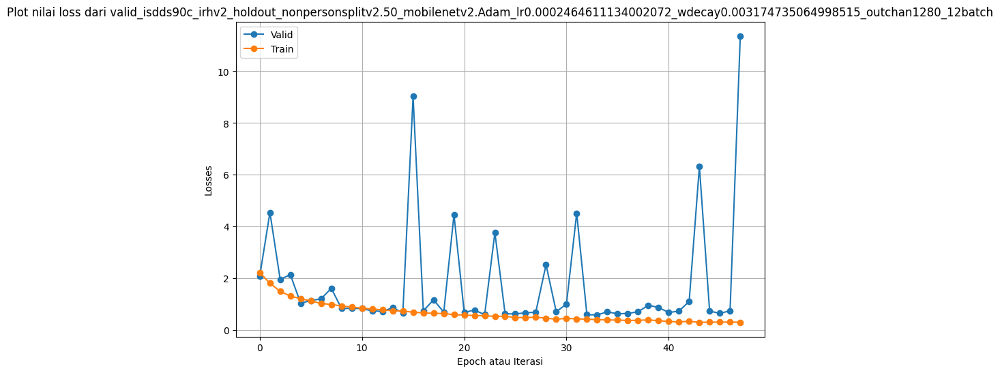

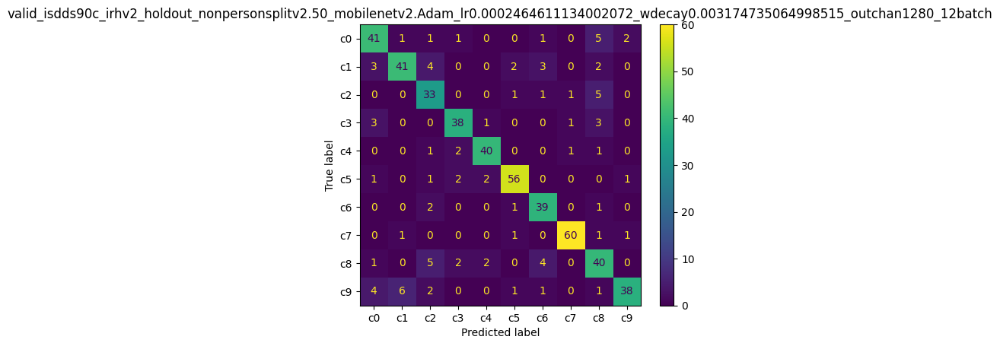

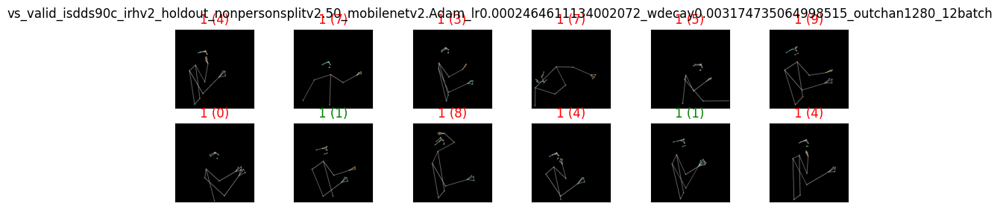

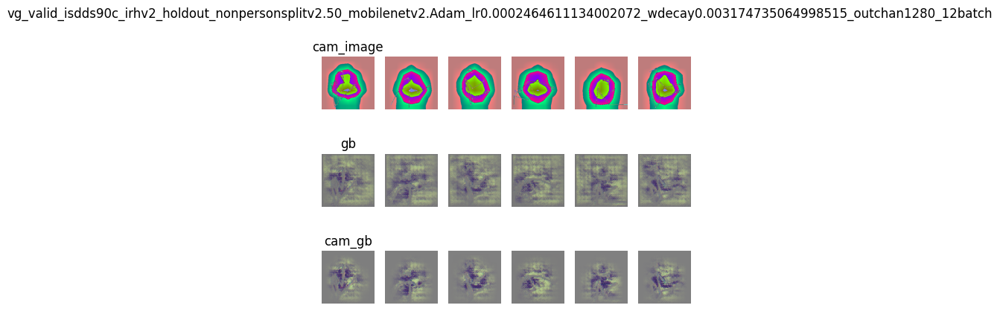

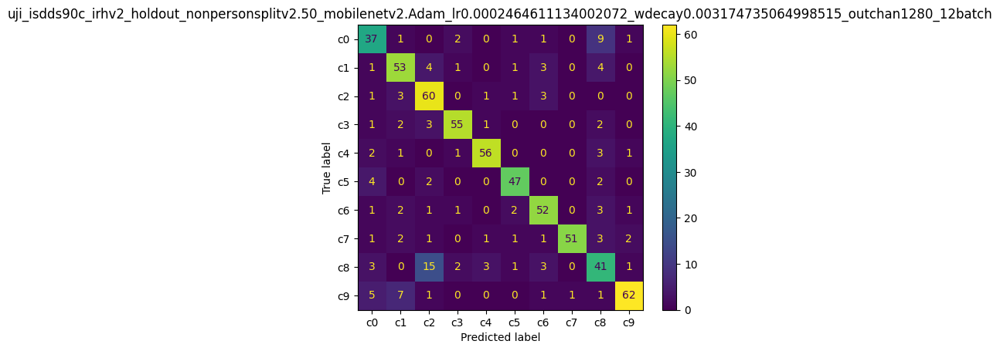

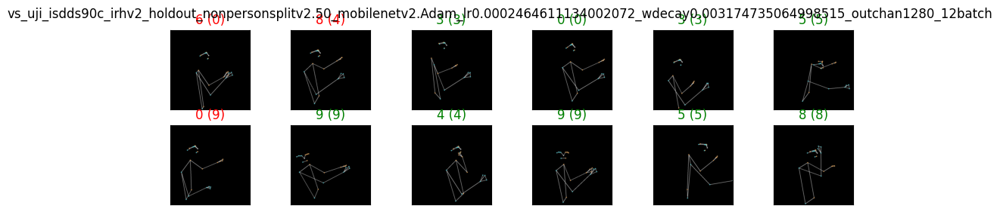

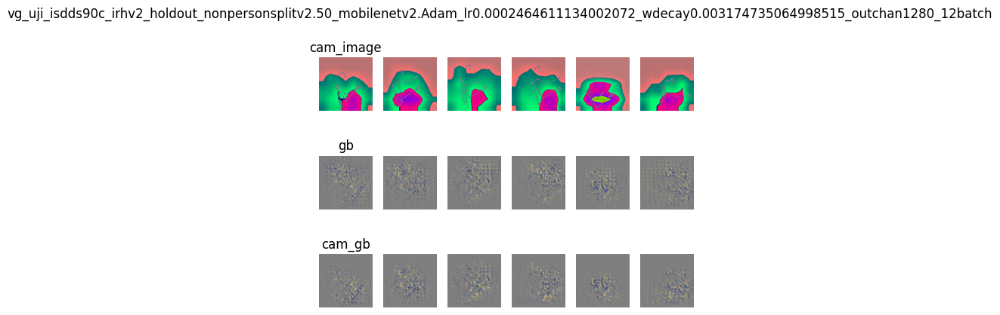

In [6]:
workflow.run_workflow(
    versi=versi, model=model, str_to_num=str_to_num,
    # init_model=init_mobilenetv2(),
    # dataset_const=dataset,
    batch_size=batch_size,
    # n_splits=n_splits,
    epochs=epochs,
    patience=patience,
    # class_names=class_names,
    path=path,
    name_model=name_model,
    name_data=name_data,
    save_path0=save_path,
    criterion_const=criterion,
    optim_const=optimizer, optim_params=optim_params,
    transform_train=transform_train, transform_test=transform_test,
    dataset_list=dataset_list,

    use_train=True
)


#### optuna berdasarkan loss

### Sudut Depanc Versi 2

In [17]:
name_model = "mobilenetv2"
model = MobileNetV2(num_classes=10)
str_to_num=False
save_path = f"../hasil/{name_model}"

path_dir = "../resources"
name_data = "isddsDepanc_irhv2_holdout_nonpersonsplitv2"
path = path_dir+"/isdds_skeleton/Depanc_v2"
dataset_list = [path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/latih_isddsDepanc_irhv2.csv",
                path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/valid_isddsDepanc_irhv2.csv",
                path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/uji_isddsDepanc_irhv2.csv",]

criterion = nn.CrossEntropyLoss()

optim_params = {}
optimizer = optim.Adam
# scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=5, factor=0.5)

patience = 15
# counter = 0

# n_splits=5
epochs=50
batch_size= 20

versi = "Adam_default_outchan1280_20batch" #X, coba lr0.001

In [ ]:
workflow.run_workflow(
    versi=versi, model=model, str_to_num=str_to_num,
    # init_model=init_mobilenetv2(),
    # dataset_const=dataset,
    batch_size=batch_size,
    # n_splits=n_splits,
    epochs=epochs,
    patience=patience,
    # class_names=class_names,
    path=path,
    name_model=name_model,
    name_data=name_data,
    save_path0=save_path,
    criterion_const=criterion,
    optim_const=optimizer, optim_params=optim_params,
    transform_train=transform_train, transform_test=transform_test,
    dataset_list=dataset_list,
    use_train=False,
)


	Epochs 50
		Best -> epoch: 50
		Training Loss: 0.308
			Training Accuracy: 89.223%
			Training Precision: 89.351%
			Training F1: 89.260%
			Training Recall: 89.223%
		Validation loss: 0.967
			Validation Accuracy: 75.969%
			Validation Precision: 77.005%
			Validation F1: 75.822%
			Validation Recall: 75.969%
		ROC AUC validation: 0.9629897022664407
	Waktu komputasi training: 711.9366471767426 detik
              precision    recall  f1-score   support

           0       0.90      0.87      0.88        52
           1       0.62      0.80      0.70        55
           2       0.82      0.88      0.85        41
           3       0.67      0.91      0.77        46
           4       0.80      0.89      0.84        45
           5       0.72      0.65      0.68        63
           6       0.77      0.79      0.78        43
           7       0.82      0.62      0.71        64
           8       0.86      0.67      0.75        54
           9       0.74      0.64      0.69        53


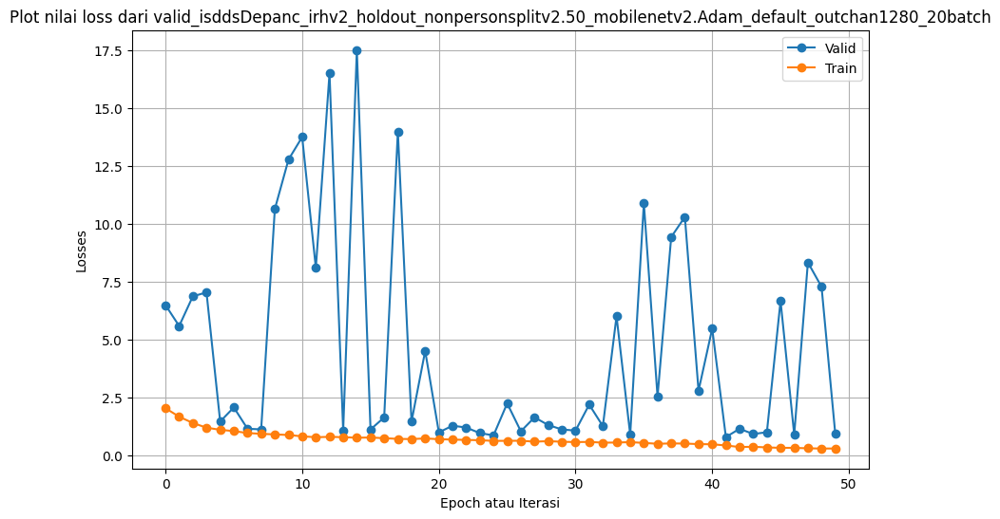

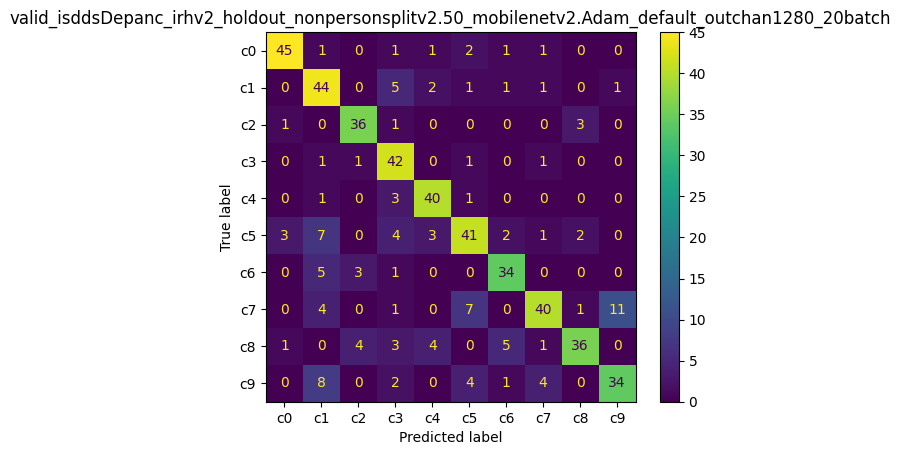

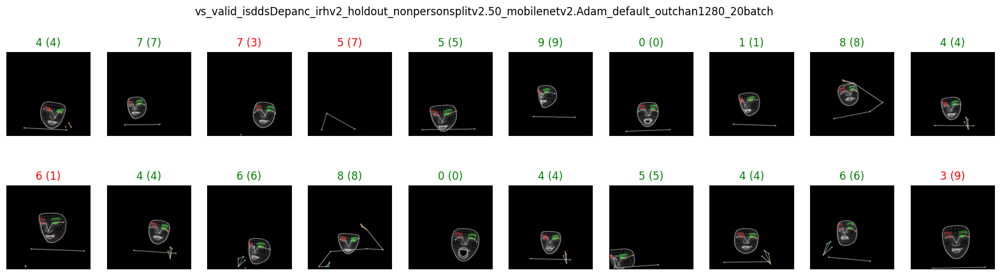

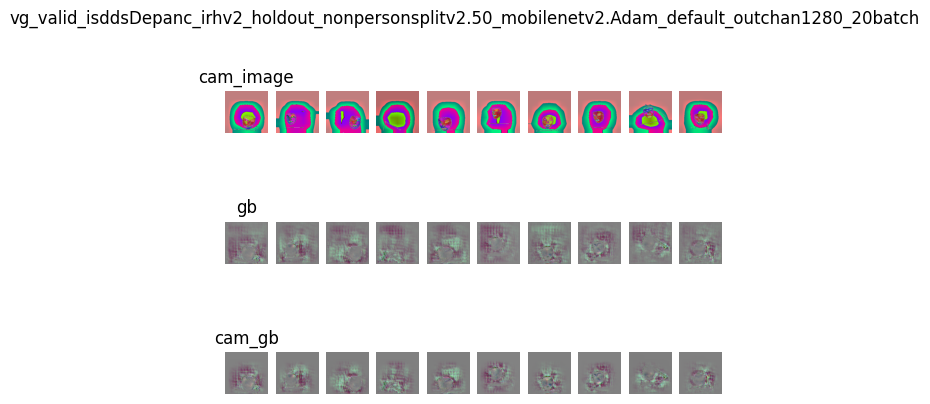

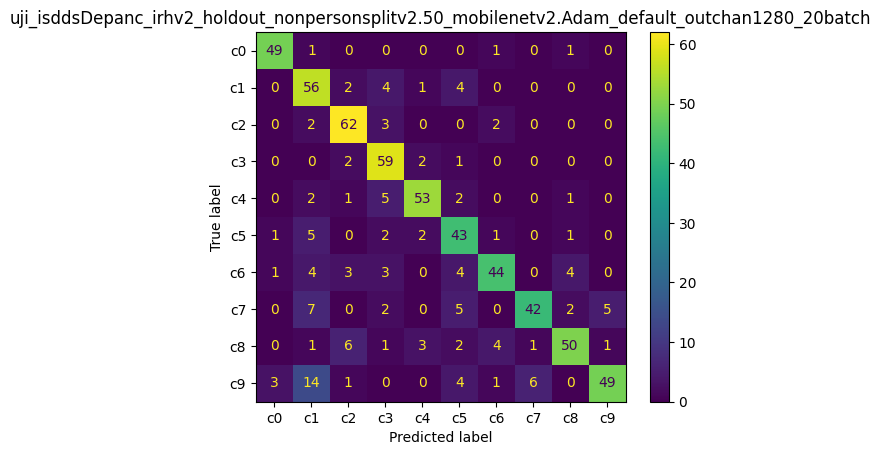

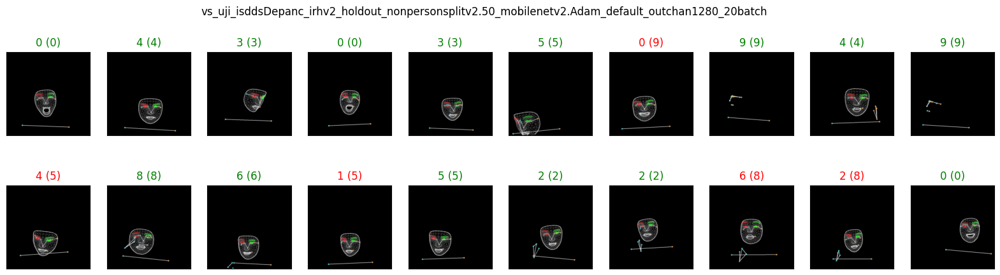

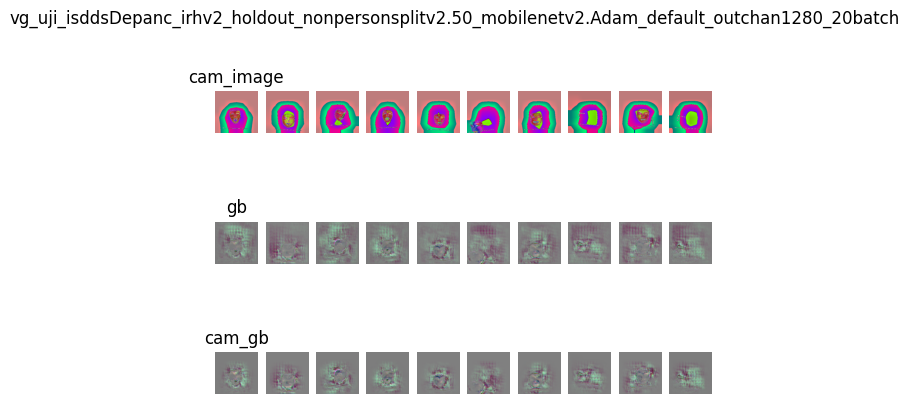

In [9]:
workflow.run_workflow(
    versi=versi, model=model, str_to_num=str_to_num,
    # init_model=init_mobilenetv2(),
    # dataset_const=dataset,
    batch_size=batch_size,
    # n_splits=n_splits,
    epochs=epochs,
    patience=patience,
    # class_names=class_names,
    path=path,
    name_model=name_model,
    name_data=name_data,
    save_path0=save_path,
    criterion_const=criterion,
    optim_const=optimizer, optim_params=optim_params,
    transform_train=transform_train, transform_test=transform_test,
    dataset_list=dataset_list
)


#### optuna berdasarkan akurasi

In [5]:
def objective_momen(trial):
    torch.cuda.empty_cache()
    
    # Generate the model.
    model = MobileNetV2(num_classes=10).to(device) #phase3
    # model = MobileNetV2_CBAM_hilmi_optuna(trial).to(device)

    # Generate the optimizers
    epochs = 20
    # batch = trial.suggest_int("batch_size", 16, 64, step=16)
    batch = trial.suggest_int("batch_size", 8, 32, log=True) # phase 2
    
    # lr = trial.suggest_float("lr", 0.00001, 0.01, log=True)  # phase2
    lr = trial.suggest_float("lr", 0.0001, 0.0100, log=True)  # phase3

    wdecay = trial.suggest_float("weight_decay", 0.0001, 0.0100, log=True) #phase2
    momen = trial.suggest_float("momentum", 0.8, 0.99, log=True) #phase 2
    # optimizer_name = trial.suggest_categorical("optimizer", ["Adam", "AdamW", "RMSprop", "SGD"]) # phase2
    optimizer_name = trial.suggest_categorical("optimizer", ["SGD", "Adam"]) #
    if (optimizer_name == "Adam") or (optimizer_name == "AdamW"):
        optimizer = getattr(optim, optimizer_name)(model.parameters(), lr=lr, weight_decay=wdecay)
    else:
        optimizer = getattr(optim, optimizer_name)(model.parameters(), lr=lr, weight_decay=wdecay, momentum=momen)
    # optimizer = getattr(optim, optimizer_name)(model.parameters(), lr=lr, weight_decay=wdecay)
    
    criterion = nn.CrossEntropyLoss()

    test_dataset = pd.read_csv(dataset_list[1])
    test_data = DfToDataset(test_dataset, path, transform_test)
    test_loader = DataLoader(test_data, batch_size=batch, shuffle=False, num_workers=1)

    train_dataset = pd.read_csv(dataset_list[0])
    train_data = DfToDataset(train_dataset, path, transform_train)
    train_loader = DataLoader(train_data, batch_size=batch, shuffle=False, num_workers=9)
    # valid_loader = DataLoader(valid_data, batch_size=batch_size, shuffle=False)
    ### ### ### ### ### ### ###
    
    start = 0
    # Training of the model.
    for epoch in range(epochs):
        start = time.time()
        model.train()
        for batch_idx, (data, target) in enumerate(train_loader):
            if str_to_num:
                target = torch.from_numpy( np.array([target_names[label] for label in target]) )
            # Limiting training data for faster epochs.
            # if batch_idx * batch_size >= n_train_examples:
            #     break

            data, target = data.to(device), target.to(device)

            output = model(data)
            loss = criterion(output, target)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # Validation of the model.
        model.eval()
        correct = 0
        with torch.no_grad():
            for batch_idx, (data, target) in enumerate(test_loader):
                if str_to_num:
                    target = torch.from_numpy( np.array([target_names[label] for label in target]) )
                # Limiting validation data.
                # if batch_idx * batch_size >= n_valid_examples:
                #     break
                data, target = data.to(device), target.to(device)
                output = model(data)
                # Get the index of the max log-probability.
                pred = output.argmax(dim=1, keepdim=True)
                correct += pred.eq(target.view_as(pred)).sum().item()

        accuracy = correct / len(test_loader.dataset)

        # report back to Optuna how far it is (epoch-wise) into the trial and how well it is doing (accuracy)
        trial.report(accuracy, epoch)  #phase 3, 4

        # # then, Optuna can decide if the trial should be pruned
        # # Handle pruning based on the intermediate value.
        if trial.should_prune(): #phase 3,4 
            raise optuna.exceptions.TrialPruned()
        
        # if round(accuracy, 2) >= round(best_acc, 2):
        #     best_acc = accuracy
        #     best_epoch = epoch
        
    end = time.time() - start
    # test_dataset = pd.read_csv("kmufed_uji.csv")
    # test_data = DfToDataset(test_dataset, path, transform_test)
    # test_loader = DataLoader(test_data, batch_size=batch, shuffle=False)

    # test_correct = 0
    # model.eval()
    # with torch.no_grad():
    #     for batch_idx, (data, target) in enumerate(test_loader):
    #         target = torch.from_numpy( np.array([class_names[label] for label in target]) )
    #         # Limiting validation data.
    #         # if batch_idx * batch_size >= n_valid_examples:
    #         #     break
    #         data, target = data.to(device), target.to(device)
    #         output = model(data)
    #         # Get the index of the max log-probability.
    #         pred = output.argmax(dim=1, keepdim=True)
    #         test_correct += pred.eq(target.view_as(pred)).sum().item()

    test_accuracy = accuracy#test_correct / len(test_loader.dataset)

    trial.report(test_accuracy, epoch)  

    # then, Optuna can decide if the trial should be pruned
    # Handle pruning based on the intermediate value.
    if trial.should_prune():
        raise optuna.exceptions.TrialPruned()

    del model
    torch.cuda.empty_cache()

    # print(f"\tbest_epoch: {best_epoch}")
    print(f"\tdurasi (detik): {end}")
    # return best_acc
    return test_accuracy

In [6]:
name_model = "mobilenetv2"
model = MobileNetV2(num_classes=10)
str_to_num=False
save_path = f"../hasil/{name_model}"

path_dir = "../resources"
name_data = "isddsDepanc_irhv2_holdout_nonpersonsplitv2"
path = path_dir+"/isdds_skeleton/Depanc_v2"
dataset_list = [path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/latih_isddsDepanc_irhv2.csv",
                path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/valid_isddsDepanc_irhv2.csv",
                path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/uji_isddsDepanc_irhv2.csv",]

criterion = nn.CrossEntropyLoss()

optim_params = {}
optimizer = optim.Adam
# scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=5, factor=0.5)

patience = 15
# counter = 0

# n_splits=5
# epochs=50
# batch_size= 20

# versi = "Adam_default_outchan1280_20batch" #X, coba lr0.001

In [8]:
# now we can run the experiment
name_file = f"{name_data}_{name_model}"#.{versi}"
n_trials=125

sampler = optuna.samplers.TPESampler()
study = optuna.create_study(study_name=f"optuna{n_trials}_{name_file}"
                            , direction="maximize", 
                            sampler=sampler,
                            # storage=f'sqlite:///../hasil/{name_model}/optuna{n_trials}_{name_file}.db')
                            storage=f'sqlite:///optuna{n_trials}_{name_file}.db',)
                            # load_if_exists=True)
study.optimize(objective_momen, n_trials=n_trials)

pruned_trials = [t for t in study.trials if t.state == optuna.trial.TrialState.PRUNED]
complete_trials = [t for t in study.trials if t.state == optuna.trial.TrialState.COMPLETE]

print("Study statistics: ")
print("  Number of finished trials: ", len(study.trials))
print("  Number of pruned trials: ", len(pruned_trials))
print("  Number of complete trials: ", len(complete_trials))

print("Best trial:")
trial = study.best_trial

print("  Value: ", trial.value)

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2025-10-11 19:53:38,875] A new study created in RDB with name: optuna125_isddsDepanc_irhv2_holdout_nonpersonsplitv2_mobilenetv2
/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-11 19:58:16,059] Trial 0 finished with value: 0.6627906976744186 and parameters: {'batch_size': 18, 'lr': 0.0006052139028580348, 'weight_decay': 0.005831691414653557, 'momentum': 0.9210845230177006, 'optimizer': 'Adam'}. Best is trial 0 with value: 0.6627906976744186.


	durasi (detik): 14.039146661758423


/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-11 20:03:04,602] Trial 1 finished with value: 0.7325581395348837 and parameters: {'batch_size': 25, 'lr': 0.00022859952172182997, 'weight_decay': 0.003039088461009659, 'momentum': 0.9660324610967232, 'optimizer': 'Adam'}. Best is trial 1 with value: 0.7325581395348837.


	durasi (detik): 14.488579511642456


/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-11 20:08:05,454] Trial 2 finished with value: 0.7422480620155039 and parameters: {'batch_size': 13, 'lr': 0.0001695705432914855, 'weight_decay': 0.00127262089883737, 'momentum': 0.8024419214259794, 'optimizer': 'Adam'}. Best is trial 2 with value: 0.7422480620155039.


	durasi (detik): 15.206403255462646


/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-11 20:12:53,925] Trial 3 finished with value: 0.29069767441860467 and parameters: {'batch_size': 16, 'lr': 0.007100363446282341, 'weight_decay': 0.0017929034587834834, 'momentum': 0.9398138955264564, 'optimizer': 'SGD'}. Best is trial 2 with value: 0.7422480620155039.


	durasi (detik): 14.422506332397461


/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-11 20:17:59,078] Trial 4 finished with value: 0.5290697674418605 and parameters: {'batch_size': 8, 'lr': 0.0021846450207047815, 'weight_decay': 0.000169407585888787, 'momentum': 0.8400587455269969, 'optimizer': 'Adam'}. Best is trial 2 with value: 0.7422480620155039.


	durasi (detik): 15.162744045257568


[I 2025-10-11 20:18:13,336] Trial 5 pruned. 
[I 2025-10-11 20:18:27,729] Trial 6 pruned. 
[I 2025-10-11 20:18:42,494] Trial 7 pruned. 
[I 2025-10-11 20:19:12,005] Trial 8 pruned. 
[I 2025-10-11 20:19:26,800] Trial 9 pruned. 
[I 2025-10-11 20:19:41,984] Trial 10 pruned. 
[I 2025-10-11 20:19:56,678] Trial 11 pruned. 
[I 2025-10-11 20:20:26,779] Trial 12 pruned. 
[I 2025-10-11 20:20:42,100] Trial 13 pruned. 
[I 2025-10-11 20:20:56,885] Trial 14 pruned. 
[I 2025-10-11 20:21:11,753] Trial 15 pruned. 
[I 2025-10-11 20:21:26,909] Trial 16 pruned. 
[I 2025-10-11 20:21:42,178] Trial 17 pruned. 
[I 2025-10-11 20:21:56,636] Trial 18 pruned. 
[I 2025-10-11 20:22:11,300] Trial 19 pruned. 
[I 2025-10-11 20:22:26,155] Trial 20 pruned. 
[I 2025-10-11 20:22:56,164] Trial 21 pruned. 
[I 2025-10-11 20:23:25,296] Trial 22 pruned. 
[I 2025-10-11 20:23:39,820] Trial 23 pruned. 
[I 2025-10-11 20:23:54,715] Trial 24 pruned. 
[I 2025-10-11 20:24:09,409] Trial 25 pruned. 
[I 2025-10-11 20:24:23,938] Trial 26 pr

	durasi (detik): 15.135297298431396


[I 2025-10-11 20:29:47,253] Trial 28 pruned. 
[I 2025-10-11 20:30:02,539] Trial 29 pruned. 
[I 2025-10-11 20:30:17,690] Trial 30 pruned. 
[I 2025-10-11 20:30:32,333] Trial 31 pruned. 
[I 2025-10-11 20:30:47,480] Trial 32 pruned. 
[I 2025-10-11 20:31:02,751] Trial 33 pruned. 
[I 2025-10-11 20:31:17,499] Trial 34 pruned. 
[I 2025-10-11 20:31:32,077] Trial 35 pruned. 
[I 2025-10-11 20:31:46,450] Trial 36 pruned. 
[I 2025-10-11 20:32:00,895] Trial 37 pruned. 
[I 2025-10-11 20:32:15,730] Trial 38 pruned. 
[I 2025-10-11 20:32:44,605] Trial 39 pruned. 
[I 2025-10-11 20:32:59,087] Trial 40 pruned. 
[I 2025-10-11 20:33:14,026] Trial 41 pruned. 
[I 2025-10-11 20:33:29,802] Trial 42 pruned. 
[I 2025-10-11 20:34:01,231] Trial 43 pruned. 
[I 2025-10-11 20:34:16,679] Trial 44 pruned. 
[I 2025-10-11 20:34:31,843] Trial 45 pruned. 
[I 2025-10-11 20:34:46,686] Trial 46 pruned. 
[I 2025-10-11 20:35:01,409] Trial 47 pruned. 
[I 2025-10-11 20:35:16,550] Trial 48 pruned. 
[I 2025-10-11 20:35:31,204] Trial 

Study statistics: 
  Number of finished trials:  125
  Number of pruned trials:  119
  Number of complete trials:  6
Best trial:
  Value:  0.7422480620155039
  Params: 
    batch_size: 13
    lr: 0.0001695705432914855
    weight_decay: 0.00127262089883737
    momentum: 0.8024419214259794
    optimizer: Adam


In [9]:
# joblib.dump(study, f"{savepath}xgb_optuna_study_batch.pkl")   # save study

# # to load it:
# jl = joblib.load(f"{savepath}xgb_optuna_study_batch.pkl")

# name_file = f"{name_data}.{epochs}_{name_model}.{versi}"

joblib.dump(study, f"optuna{n_trials}_{name_file}.pkl")

['optuna125_isddsDepanc_irhv2_holdout_nonpersonsplitv2_mobilenetv2.pkl']

In [ ]:
optuna.visualization.plot_param_importances(study)

In [ ]:
optuna.visualization.plot_intermediate_values(study)

#### mencoba hasil optuna berdasarkan akurasi

In [5]:
name_model = "mobilenetv2"
model = MobileNetV2(num_classes=10)
str_to_num=False
save_path = f"../hasil/{name_model}"

path_dir = "../resources"
name_data = "isddsDepanc_irhv2_holdout_nonpersonsplitv2"
path = path_dir+"/isdds_skeleton/Depanc_v2"
dataset_list = [path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/latih_isddsDepanc_irhv2.csv",
                path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/valid_isddsDepanc_irhv2.csv",
                path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/uji_isddsDepanc_irhv2.csv",]

# Best trial:
# Value:  0.7422480620155039
# Params: 
    # batch_size: 13
    # lr: 0.0001695705432914855
    # weight_decay: 0.00127262089883737
    # momentum: 0.8024419214259794 (adam ga pakai momentum)
    # optimizer: Adam


criterion = nn.CrossEntropyLoss()

optim_params = {'lr':0.0001695705432914855, 'weight_decay':0.00127262089883737,}
optimizer = optim.Adam
# scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=5, factor=0.5)

patience = 15
# counter = 0

# n_splits=5
epochs=50
batch_size= 13

versi = "Adam_lr0.0001695705432914855_wdecay0.00127262089883737_outchan1280_13batch" #X, coba lr0.001

Folder sudah tersebut sudah ada, yakin tetap melanjutkan fungsi run_workflow()?(y/n)
status use_train:  False
fungsi tetap dijalankan
	Epochs bukan train
		Best -> epoch: bukan train
		Training Loss: 0.551
			Training Accuracy: 81.602%
			Training Precision: 82.330%
			Training F1: 81.569%
			Training Recall: 81.602%
		Validation loss: 0.831
			Validation Accuracy: 77.132%
			Validation Precision: 78.284%
			Validation F1: 77.077%
			Validation Recall: 77.132%
		ROC AUC validation: 0.9609770077227002
	Waktu komputasi training: 5.97372841835022 detik
              precision    recall  f1-score   support

           0       0.98      0.88      0.93        52
           1       0.59      0.76      0.67        55
           2       0.72      0.93      0.81        41
           3       0.73      0.96      0.83        46
           4       0.86      0.82      0.84        45
           5       0.77      0.65      0.71        63
           6       0.83      0.81      0.82        43
           

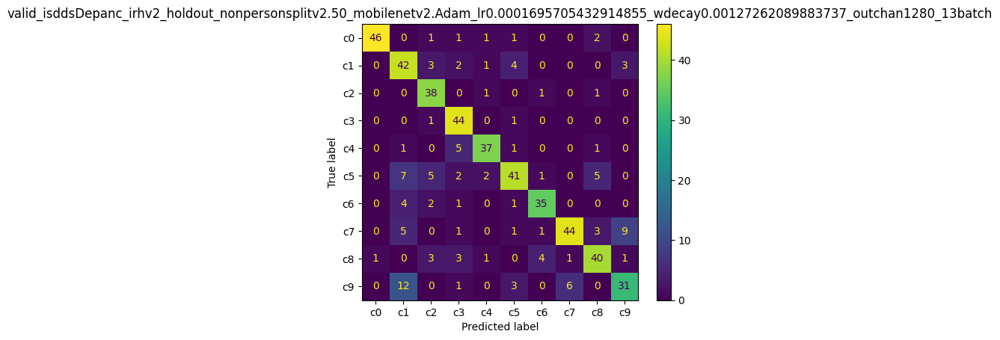

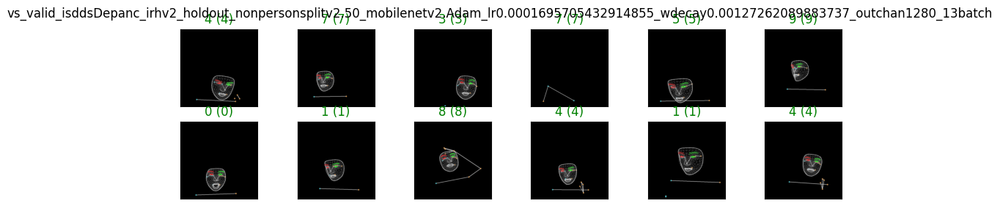

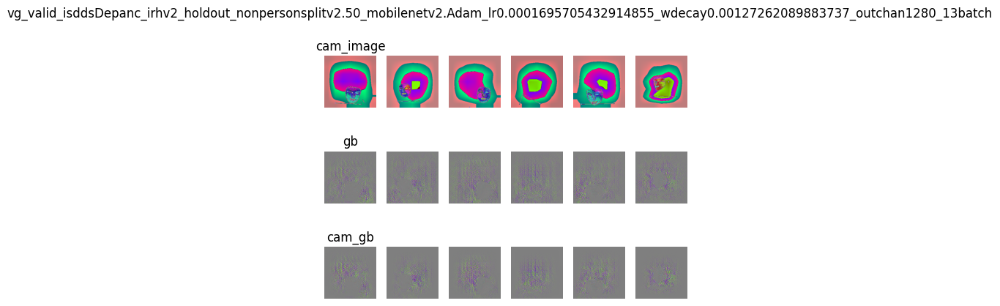

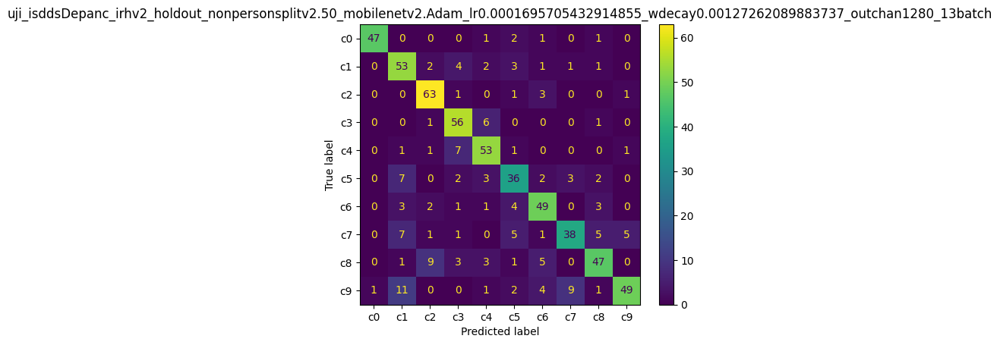

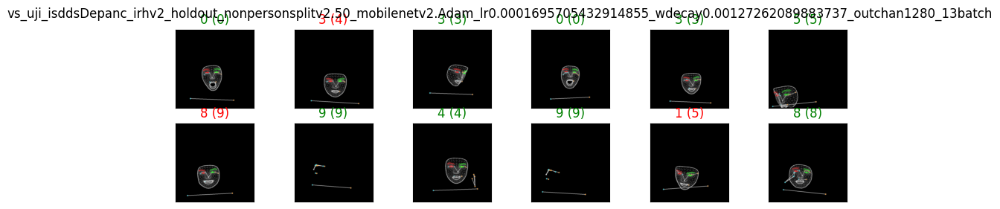

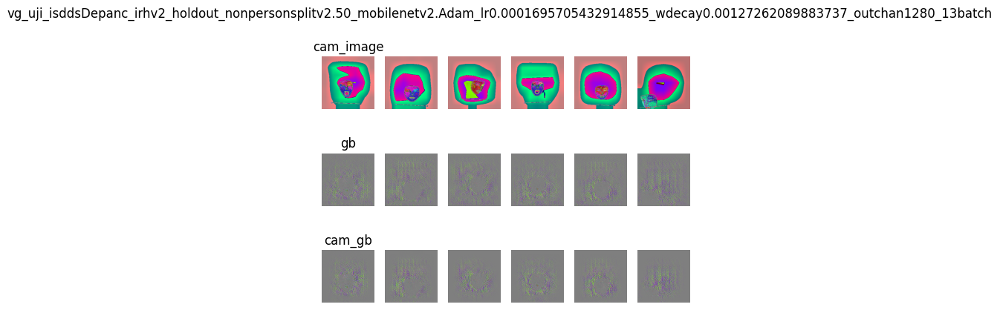

In [6]:
workflow.run_workflow(
    versi=versi, model=model, str_to_num=str_to_num,
    # init_model=init_mobilenetv2(),
    # dataset_const=dataset,
    batch_size=batch_size,
    # n_splits=n_splits,
    epochs=epochs,
    patience=patience,
    # class_names=class_names,
    path=path,
    name_model=name_model,
    name_data=name_data,
    save_path0=save_path,
    criterion_const=criterion,
    optim_const=optimizer, optim_params=optim_params,
    transform_train=transform_train, transform_test=transform_test,
    dataset_list=dataset_list,

    use_train=False
)


	Epochs 50
		Best -> epoch: 48
		Training Loss: 0.439
			Training Accuracy: 84.709%
			Training Precision: 84.914%
			Training F1: 84.773%
			Training Recall: 84.709%
		Validation loss: 0.831
			Validation Accuracy: 77.132%
			Validation Precision: 78.284%
			Validation F1: 77.077%
			Validation Recall: 77.132%
		ROC AUC validation: 0.9609770077227002
	Waktu komputasi training: 777.5581777095795 detik
              precision    recall  f1-score   support

           0       0.98      0.88      0.93        52
           1       0.59      0.76      0.67        55
           2       0.72      0.93      0.81        41
           3       0.73      0.96      0.83        46
           4       0.86      0.82      0.84        45
           5       0.77      0.65      0.71        63
           6       0.83      0.81      0.82        43
           7       0.86      0.69      0.77        64
           8       0.77      0.74      0.75        54
           9       0.70      0.58      0.64        53


ValueError: num must be an integer with 1 <= num <= 12, not 13

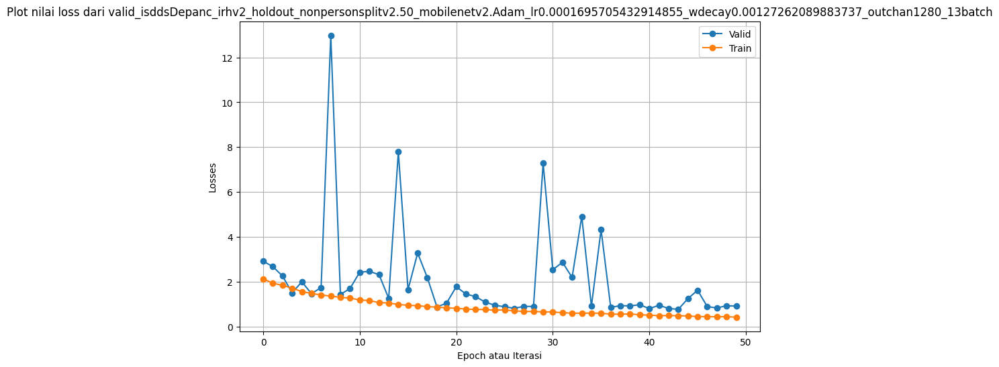

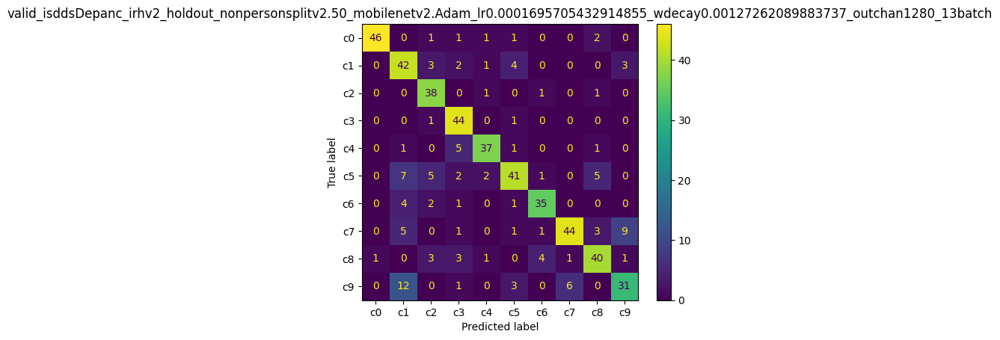

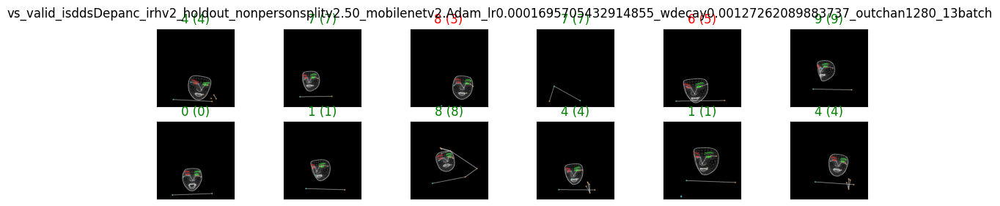

In [ ]:
# workflow.run_workflow(
#     versi=versi, model=model, str_to_num=str_to_num,
#     # init_model=init_mobilenetv2(),
#     # dataset_const=dataset,
#     batch_size=batch_size,
#     # n_splits=n_splits,
#     epochs=epochs,
#     patience=patience,
#     # class_names=class_names,
#     path=path,
#     name_model=name_model,
#     name_data=name_data,
#     save_path0=save_path,
#     criterion_const=criterion,
#     optim_const=optimizer, optim_params=optim_params,
#     transform_train=transform_train, transform_test=transform_test,
#     dataset_list=dataset_list,


# )


## ISDDS POV2

In [ ]:
# from basic_workflow_comvis import Pov2ImageDataset_V4

In [5]:
mean = np.array(0.5)
std = np.array(0.5)

transform_train = transforms.Compose([
    transforms.Resize(size=(224, 224)),
    transforms.RandomAffine(degrees=(-15, 15), shear=(-15, 15)),

#   transforms.Lambda(lambda img: imgaug_transform.augment_image(np.array(img))),
    transforms.RandomRotation(15),
    transforms.ToTensor(),
    transforms.Normalize(mean,std),
])

transform_test = transforms.Compose([
    transforms.Resize(size=(224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean,std),
])

In [6]:
path_dir = "../resources"
name_data = "isddsc-pov2-irhv2-holdout-nonpersonsplitv2"

path90 = path_dir+"/isdds_skeleton/90c_v2"
dataset_list_90 = [path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/latih_isdds90c_irhv2.csv",
                path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/valid_isdds90c_irhv2.csv",
                path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/uji_isdds90c_irhv2.csv",]

pathDep = path_dir+"/isdds_skeleton/Depanc_v2"
dataset_list_dep = [path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/latih_isddsDepanc_irhv2.csv",
                path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/valid_isddsDepanc_irhv2.csv",
                path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/uji_isddsDepanc_irhv2.csv",]

train_data = Pov2ImageDataset_V4(dataset_list_90[0], dataset_list_dep[0],
                                 path_90=path90,
                                 path_dep=pathDep,
                                 transform=transform_test)

valid_data = Pov2ImageDataset_V4(dataset_list_90[1], dataset_list_dep[1],
                                 path_90=path90,
                                 path_dep=pathDep,
                                 transform=transform_test)

test_data = Pov2ImageDataset_V4(dataset_list_90[2], dataset_list_dep[2],
                                 path_90=path90,
                                 path_dep=pathDep,
                                 transform=transform_test)

# train_loader = DataLoader(train_data, batch_size=3, shuffle=False, num_workers=0)
# test_loader = DataLoader(valid_data, batch_size=3, shuffle=False, num_workers=1)
dataset_list2 = [train_data, valid_data, test_data]


### Uji coba pov2

In [10]:
# name_file = f"kmu_fed_kfold{n_splits}.{fi}.{epochs}_mobilenetv2_v0.3"
name_model = "mobilenetv2"
# model = MobileNetV2_CBAM_hilmi(10)
model = MobileNetV2(num_classes=10, color_channel=2)
str_to_num=False
save_path = f"../hasil/mobilenetv2"

# path_dir = "../resources"
# name_data = "isdds90c_irhv2_holdout_nonpersonsplitv2"
# path = path_dir+"/isdds_skeleton/90c_v2"
# dataset_list = [path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/latih_isdds90c_irhv2.csv",
#                 path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/valid_isdds90c_irhv2.csv",
#                 path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/uji_isdds90c_irhv2.csv",]


criterion = nn.CrossEntropyLoss()

optim_params = {}
optimizer = optim.Adam
# scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=5, factor=0.5)

patience = 15#30
# counter = 0

# n_splits=5
epochs=1        #50#250#20
batch_size= 20  #8#64#32

versi = "Adam-default-outchan1280-20batch" #X, coba lr0.001

Folder tersebut sudah ada, yakin tetap melanjutkan fungsi run_workflow()?(y/n)
status use_train:  True
fungsi tetap dijalankan
	Epochs 1
		Best -> epoch: 1
		Training Loss: 1.959
			Training Accuracy: 28.592%
			Training Precision: 28.854%
			Training F1: 28.066%
			Training Recall: 28.592%
		Validation loss: 15.208
			Validation Accuracy: 8.721%
			Validation Precision: 0.762%
			Validation F1: 1.402%
			Validation Recall: 8.721%
		ROC AUC validation: 0.6061336344727458
	Waktu komputasi training: 15.330374002456665 detik
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        52
           1       0.00      0.00      0.00        55
           2       0.00      0.00      0.00        41
           3       0.00      0.00      0.00        46
           4       0.09      1.00      0.16        45
           5       0.00      0.00      0.00        63
           6       0.00      0.00      0.00        43
           7       0.00      0.00      

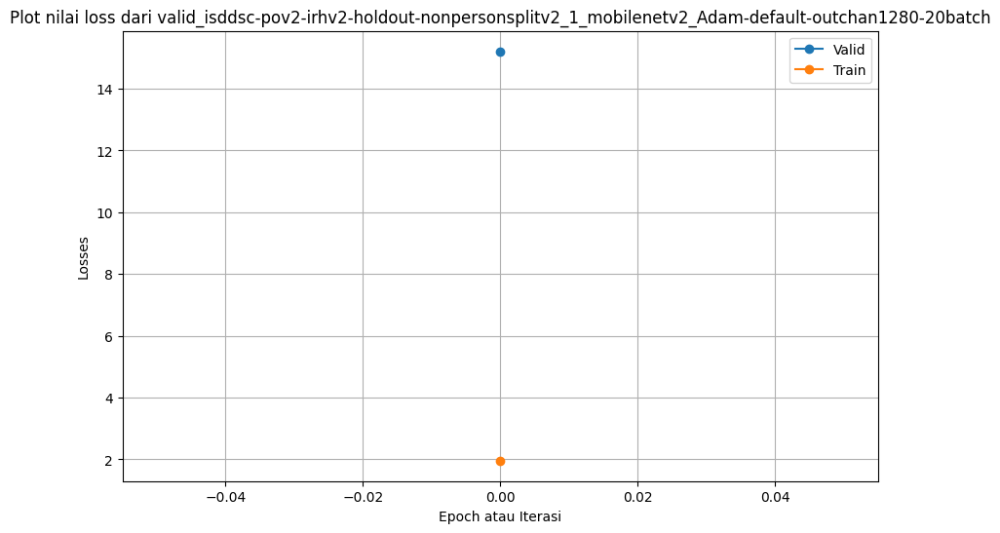

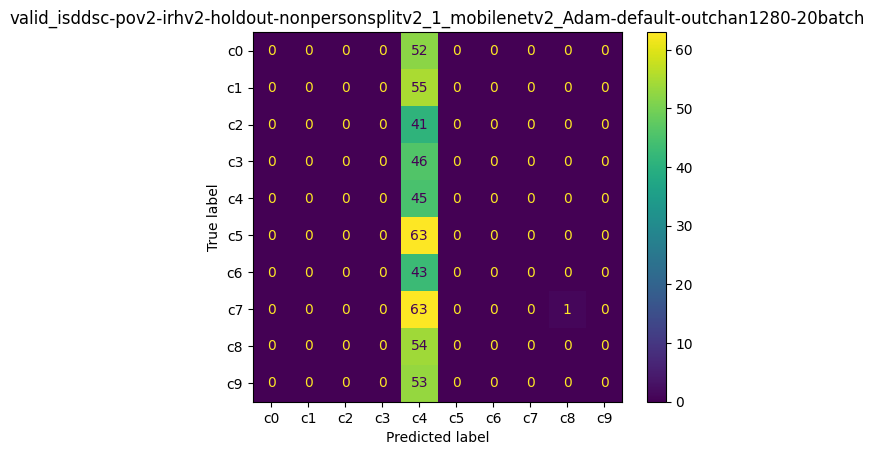

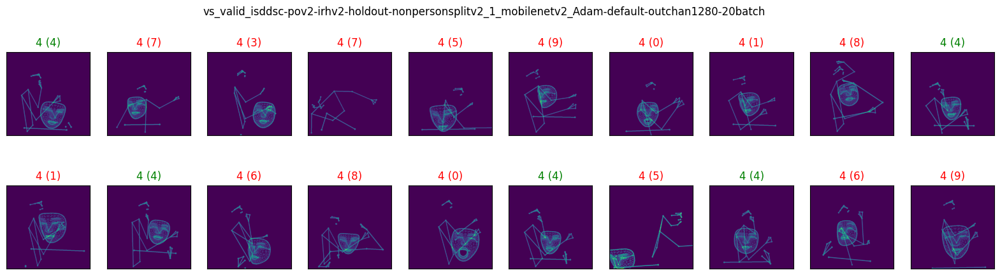

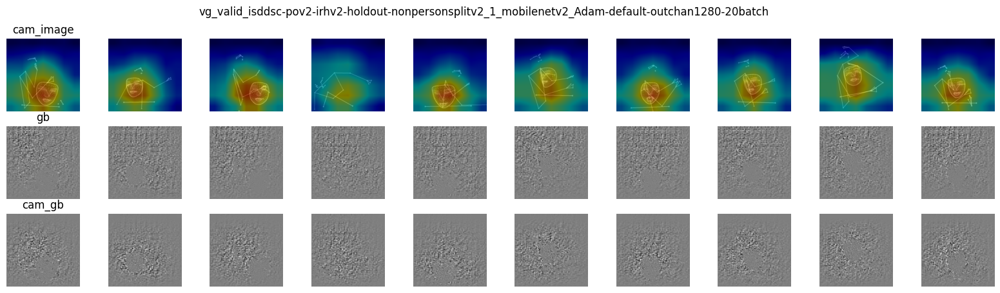

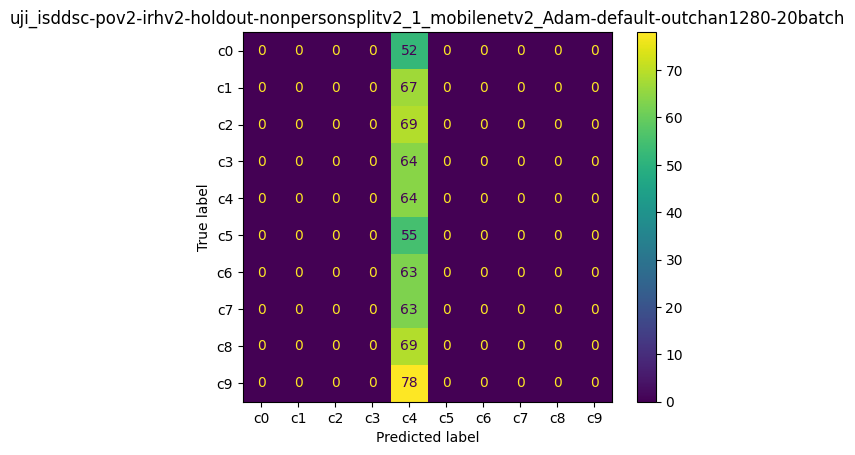

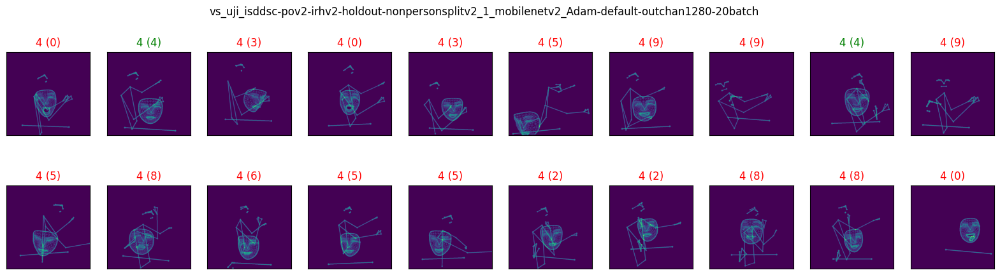

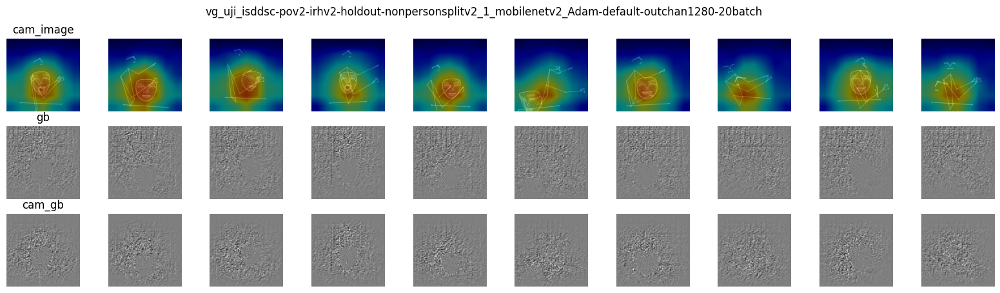

In [8]:
workflow.run_workflow(
    versi=versi, model=model, str_to_num=str_to_num,
    # init_model=init_mobilenetv2(),
    # dataset_const=dataset,
    batch_size=batch_size,
    # n_splits=n_splits,
    epochs=epochs,
    patience=patience,
    # class_names=class_names,
    path='path',
    name_model=name_model,
    name_data=name_data,
    save_path0=save_path,
    criterion_const=criterion,
    optim_const=optimizer, optim_params=optim_params,
    transform_train=transform_train, transform_test=transform_test,
    # dataset_list=None,
    dataset_list2=dataset_list2,
    use_pov2=True,
)


### isddsc-pov2-irhv2-holdout-nonpersonsplitv2_50_mobilenetv2_Adam-default-outchan1280-20batch

#### default

Folder tersebut sudah ada, yakin tetap melanjutkan fungsi run_workflow()?(y/n)
status use_train:  True
fungsi tetap dijalankan
	Epochs 50
		Best -> epoch: 37
		Training Loss: 0.005
			Training Accuracy: 99.854%
			Training Precision: 99.855%
			Training F1: 99.854%
			Training Recall: 99.854%
		Validation loss: 0.794
			Validation Accuracy: 85.659%
			Validation Precision: 86.030%
			Validation F1: 85.754%
			Validation Recall: 85.659%
		ROC AUC validation: 0.9834009467311352
	Waktu komputasi training: 883.3893849849701 detik
              precision    recall  f1-score   support

           0       0.94      0.88      0.91        52
           1       0.74      0.82      0.78        55
           2       0.80      0.90      0.85        41
           3       0.85      0.85      0.85        46
           4       0.95      0.89      0.92        45
           5       0.92      0.89      0.90        63
           6       0.86      0.88      0.87        43
           7       0.97      0.92  

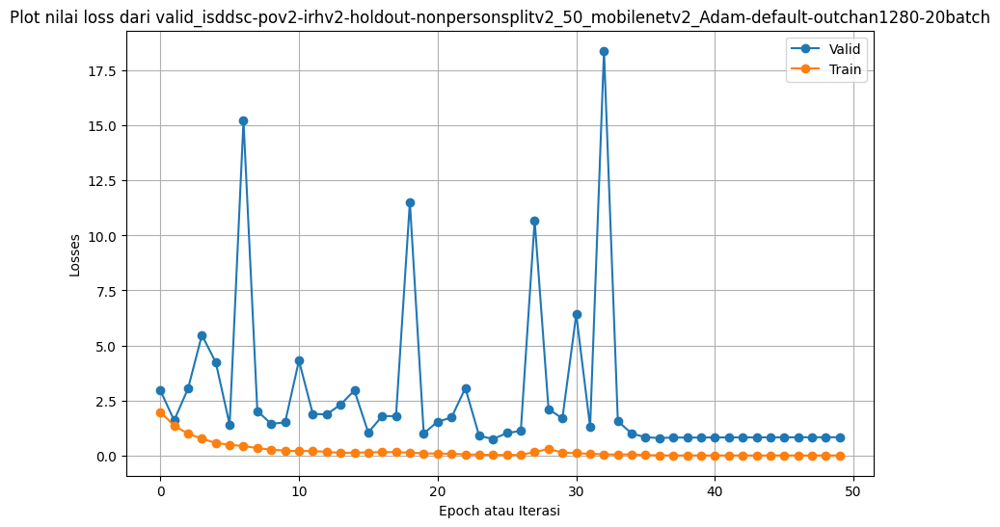

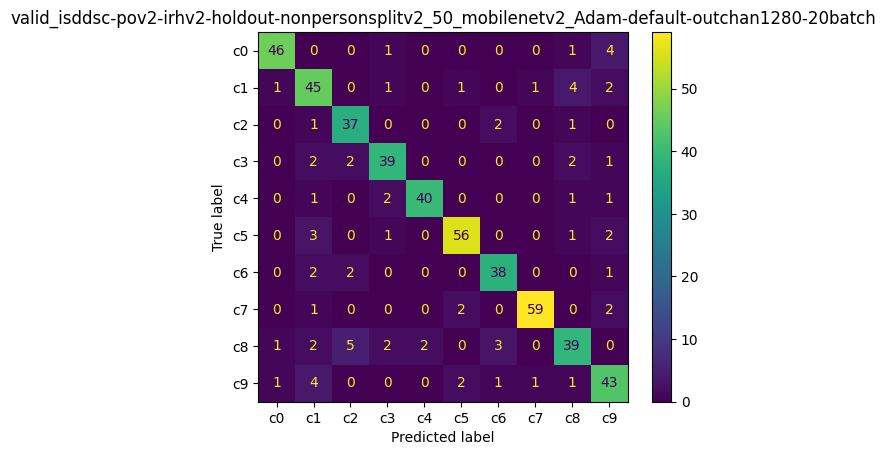

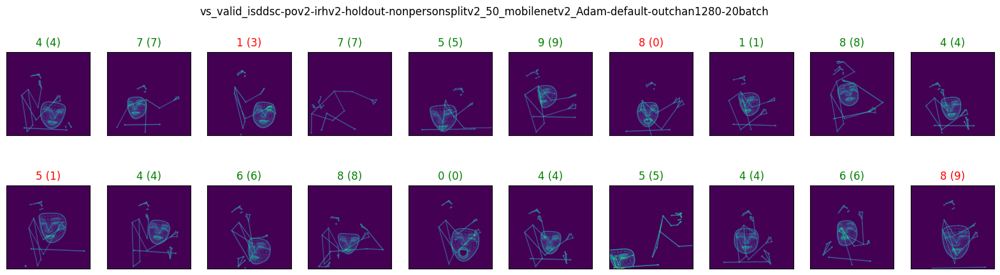

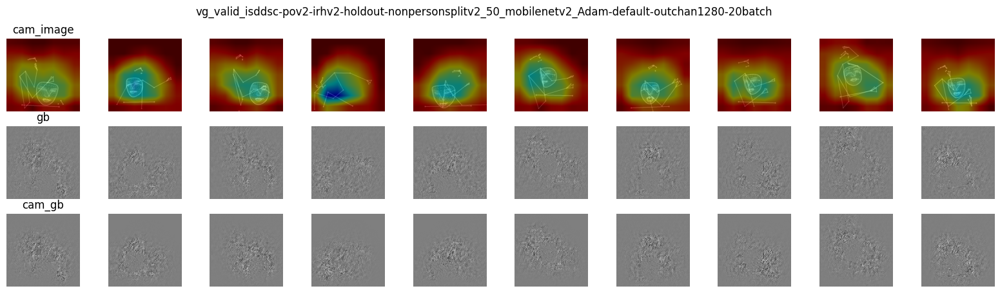

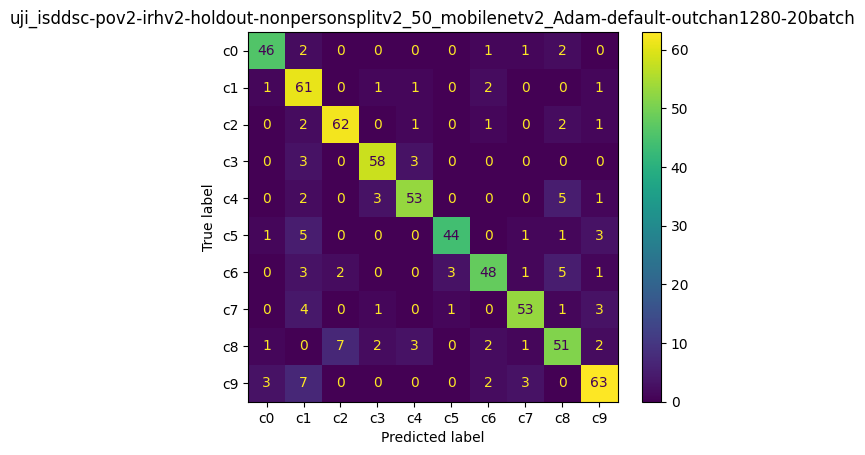

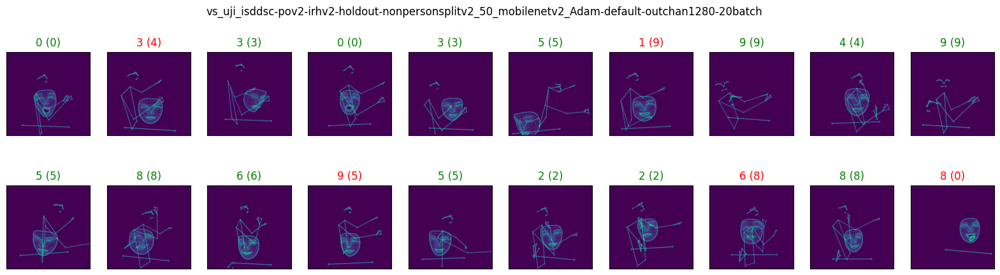

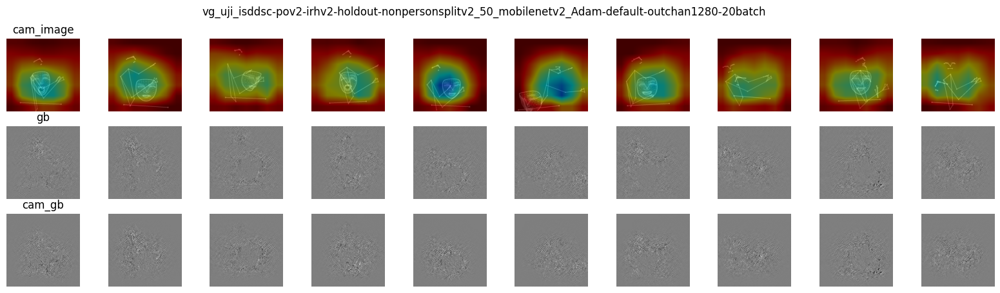

In [20]:
# name_file = f"kmu_fed_kfold{n_splits}.{fi}.{epochs}_mobilenetv2_v0.3"
name_model = "mobilenetv2"
# model = MobileNetV2_CBAM_hilmi(10)
model = MobileNetV2(num_classes=10, color_channel=2)
str_to_num=False
save_path = f"../hasil/mobilenetv2"

# path_dir = "../resources"
# name_data = "isdds90c_irhv2_holdout_nonpersonsplitv2"
# path = path_dir+"/isdds_skeleton/90c_v2"
# dataset_list = [path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/latih_isdds90c_irhv2.csv",
#                 path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/valid_isdds90c_irhv2.csv",
#                 path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/uji_isdds90c_irhv2.csv",]


criterion = nn.CrossEntropyLoss()

optim_params = {}
optimizer = optim.Adam
# scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=5, factor=0.5)

patience = 15#30
# counter = 0

# n_splits=5
epochs=50        #50#250#20
batch_size= 20  #8#64#32

versi = "Adam-default-outchan1280-20batch" #X, coba lr0.001

workflow.run_workflow(
    versi=versi, model=model, str_to_num=str_to_num,
    # init_model=init_mobilenetv2(),
    # dataset_const=dataset,
    batch_size=batch_size,
    # n_splits=n_splits,
    epochs=epochs,
    patience=patience,
    # class_names=class_names,
    path='path',
    name_model=name_model,
    name_data=name_data,
    save_path0=save_path,
    criterion_const=criterion,
    optim_const=optimizer, optim_params=optim_params,
    transform_train=transform_train, transform_test=transform_test,
    # dataset_list=None,
    dataset_list2=dataset_list2,
    use_pov2=True,
)


Folder tersebut sudah ada, yakin tetap melanjutkan fungsi run_workflow()?(y/n)
status use_train:  False
fungsi tetap dijalankan
	Epochs bukan train
		Best -> epoch: bukan train
		Training Loss: 0.008
			Training Accuracy: 99.757%
			Training Precision: 99.761%
			Training F1: 99.758%
			Training Recall: 99.757%
		Validation loss: 0.794
			Validation Accuracy: 85.659%
			Validation Precision: 86.030%
			Validation F1: 85.754%
			Validation Recall: 85.659%
		ROC AUC validation: 0.9834009467311352
	Waktu komputasi training: 7.198432922363281 detik
              precision    recall  f1-score   support

           0       0.94      0.88      0.91        52
           1       0.74      0.82      0.78        55
           2       0.80      0.90      0.85        41
           3       0.85      0.85      0.85        46
           4       0.95      0.89      0.92        45
           5       0.92      0.89      0.90        63
           6       0.86      0.88      0.87        43
           7    

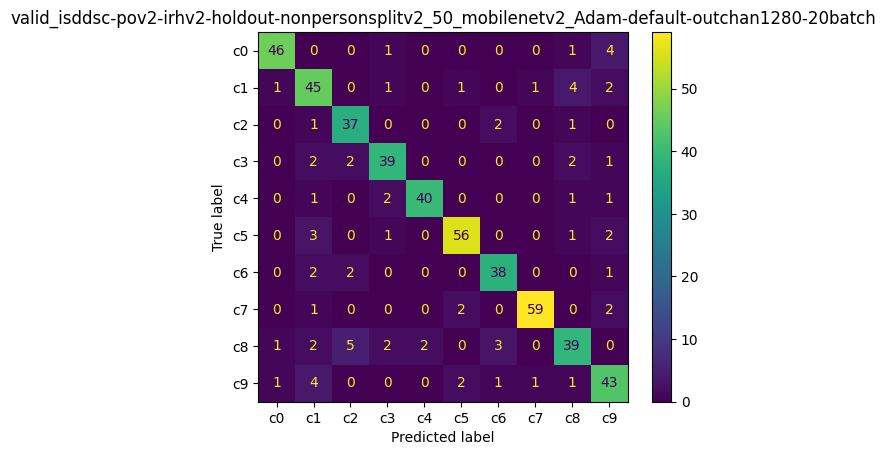

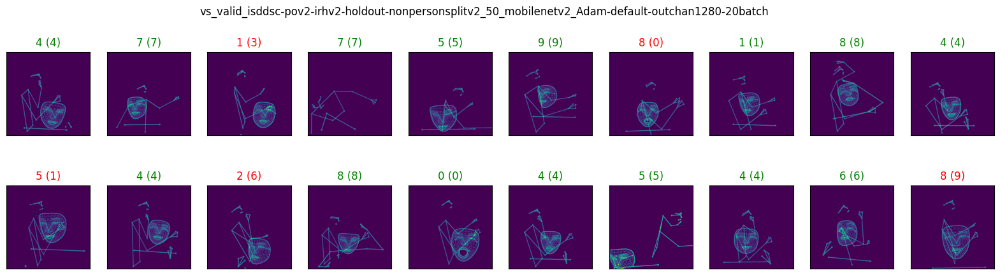

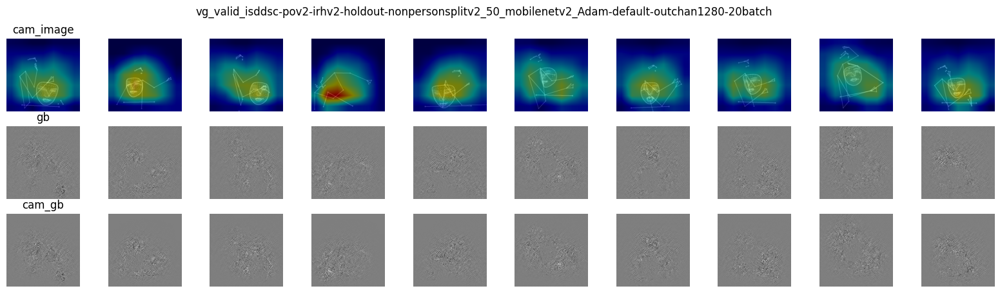

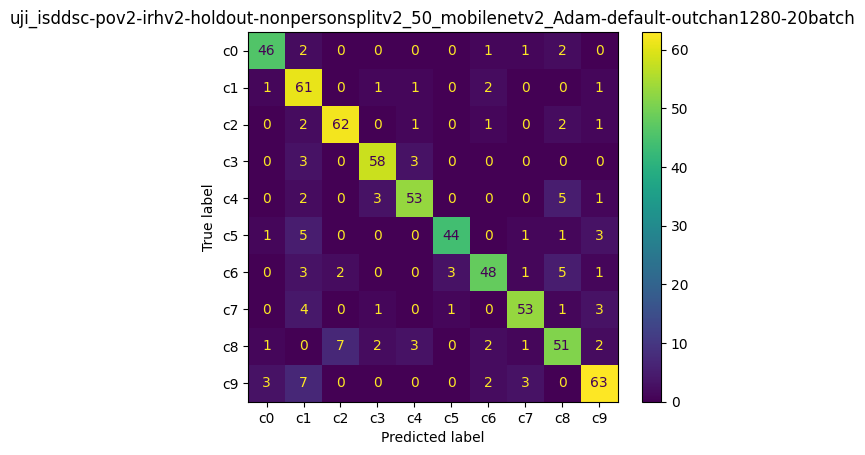

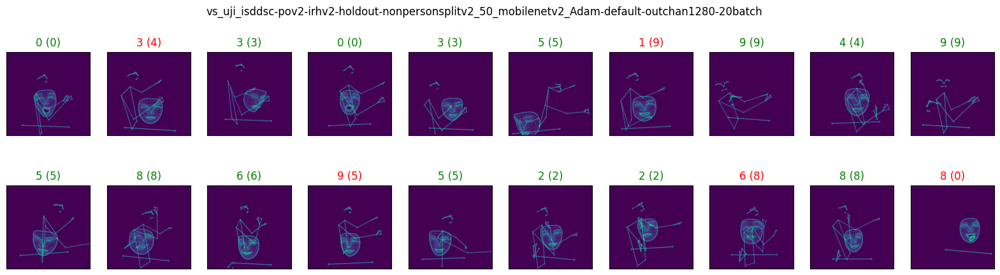

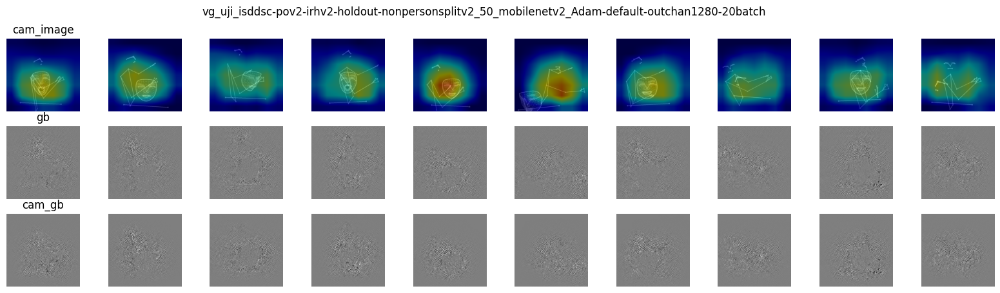

In [9]:
# name_file = f"kmu_fed_kfold{n_splits}.{fi}.{epochs}_mobilenetv2_v0.3"
name_model = "mobilenetv2"
# model = MobileNetV2_CBAM_hilmi(10)
model = MobileNetV2(num_classes=10, color_channel=2)
str_to_num=False
save_path = f"../hasil/mobilenetv2"

# path_dir = "../resources"
# name_data = "isdds90c_irhv2_holdout_nonpersonsplitv2"
# path = path_dir+"/isdds_skeleton/90c_v2"
# dataset_list = [path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/latih_isdds90c_irhv2.csv",
#                 path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/valid_isdds90c_irhv2.csv",
#                 path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/uji_isdds90c_irhv2.csv",]


criterion = nn.CrossEntropyLoss()

optim_params = {}
optimizer = optim.Adam
# scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=5, factor=0.5)

patience = 15#30
# counter = 0

# n_splits=5
epochs=50        #50#250#20
batch_size= 20  #8#64#32

versi = "Adam-default-outchan1280-20batch" #X, coba lr0.001

workflow.run_workflow(
    versi=versi, model=model, str_to_num=str_to_num,
    # init_model=init_mobilenetv2(),
    # dataset_const=dataset,
    batch_size=batch_size,
    # n_splits=n_splits,
    epochs=epochs,
    patience=patience,
    # class_names=class_names,
    path='path',
    name_model=name_model,
    name_data=name_data,
    save_path0=save_path,
    criterion_const=criterion,
    optim_const=optimizer, optim_params=optim_params,
    transform_train=transform_train, transform_test=transform_test,
    # dataset_list=None,
    dataset_list2=dataset_list2,
    use_pov2=True,
    use_train=False
)


### optuna berdasarkan akurasi

In [14]:
# import time
# class_names = {
#   "AN": 0,
#   "DI": 1,
#   "FE": 2,
#   "HA": 3,
#   "SA": 4,
#   "SU": 5
# }

def objective_momen(trial):
    torch.cuda.empty_cache()
    
    # Generate the model.
    model = MobileNetV2(num_classes=10, color_channel=2).to(device) #phase3
    # model = MobileNetV2_CBAM_hilmi_optuna(trial).to(device)

    # Generate the optimizers.
    # epochs = trial.suggest_int("epochs", 15, 30, log=True) # phase 2
    epochs = 20
    # batch = trial.suggest_int("batch_size", 16, 64, step=16)
    batch = trial.suggest_int("batch_size", 8, 32, log=True) # phase 2
    
    # lr = trial.suggest_float("lr", 0.00001, 0.01, log=True)  # phase2
    lr = trial.suggest_float("lr", 0.0001, 0.0100, log=True)  # phase3

    wdecay = trial.suggest_float("weight_decay", 0.0001, 0.0100, log=True) #phase2
    momen = trial.suggest_float("momentum", 0.8, 0.99, log=True) #phase 2
    # optimizer_name = trial.suggest_categorical("optimizer", ["Adam", "AdamW", "RMSprop", "SGD"]) # phase2
    optimizer_name = trial.suggest_categorical("optimizer", ["SGD", "Adam"]) #
    if (optimizer_name == "Adam") or (optimizer_name == "AdamW"):
        optimizer = getattr(optim, optimizer_name)(model.parameters(), lr=lr, weight_decay=wdecay)
    else:
        optimizer = getattr(optim, optimizer_name)(model.parameters(), lr=lr, weight_decay=wdecay, momentum=momen)
    # optimizer = getattr(optim, optimizer_name)(model.parameters(), lr=lr, weight_decay=wdecay)
    
    criterion = nn.CrossEntropyLoss()
  
    # test_dataset = pd.read_csv(dataset_list[1])
    # test_data = DfToDataset(test_dataset, path, transform_test)
    valid_loader = DataLoader(dataset_list2[1], batch_size=batch, shuffle=False, num_workers=1)

    # train_dataset = pd.read_csv(dataset_list[0])
    # train_data = DfToDataset(train_dataset, path, transform_train)

    # print( next(iter(train_data)))
    # plt.imshow( next(iter(train_data))[0].view(224, 224, 3) )
    # break

    # batch_size = 8  # Sesuaikan dengan kebutuhan Anda
    train_loader = DataLoader(dataset_list2[0], batch_size=batch, shuffle=False, num_workers=9)
    # valid_loader = DataLoader(valid_data, batch_size=batch_size, shuffle=False)
    ### ### ### ### ### ### ###
    # best_acc = 0.0
    # best_epoch = 0
    start = 0
    # Training of the model.
    for epoch in range(epochs):
        start = time.time()
        model.train()
        for batch_idx, (data, target) in enumerate(train_loader):
            if str_to_num:
                target = torch.from_numpy( np.array([target_names[label] for label in target]) )
            # Limiting training data for faster epochs.
            # if batch_idx * batch_size >= n_train_examples:
            #     break

            data, target = data.to(device), target.to(device)

            output = model(data)
            loss = criterion(output, target)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # Validation of the model.
        model.eval()
        correct = 0
        with torch.no_grad():
            for batch_idx, (data, target) in enumerate(valid_loader):
                if str_to_num:
                    target = torch.from_numpy( np.array([target_names[label] for label in target]) )
                # Limiting validation data.
                # if batch_idx * batch_size >= n_valid_examples:
                #     break
                data, target = data.to(device), target.to(device)
                output = model(data)
                # Get the index of the max log-probability.
                pred = output.argmax(dim=1, keepdim=True)
                correct += pred.eq(target.view_as(pred)).sum().item()

        accuracy = correct / len(valid_loader.dataset)

        # report back to Optuna how far it is (epoch-wise) into the trial and how well it is doing (accuracy)
        trial.report(accuracy, epoch)  #phase 3, 4

        # # then, Optuna can decide if the trial should be pruned
        # # Handle pruning based on the intermediate value.
        if trial.should_prune(): #phase 3,4 
            raise optuna.exceptions.TrialPruned()
        
        # if round(accuracy, 2) >= round(best_acc, 2):
        #     best_acc = accuracy
        #     best_epoch = epoch
        
    end = time.time() - start
    # test_dataset = pd.read_csv("kmufed_uji.csv")
    # test_data = DfToDataset(test_dataset, path, transform_test)
    # test_loader = DataLoader(test_data, batch_size=batch, shuffle=False)

    # test_correct = 0
    # model.eval()
    # with torch.no_grad():
    #     for batch_idx, (data, target) in enumerate(test_loader):
    #         target = torch.from_numpy( np.array([class_names[label] for label in target]) )
    #         # Limiting validation data.
    #         # if batch_idx * batch_size >= n_valid_examples:
    #         #     break
    #         data, target = data.to(device), target.to(device)
    #         output = model(data)
    #         # Get the index of the max log-probability.
    #         pred = output.argmax(dim=1, keepdim=True)
    #         test_correct += pred.eq(target.view_as(pred)).sum().item()

    test_accuracy = accuracy#test_correct / len(test_loader.dataset)

    trial.report(test_accuracy, epoch)  

    # then, Optuna can decide if the trial should be pruned
    # Handle pruning based on the intermediate value.
    if trial.should_prune():
        raise optuna.exceptions.TrialPruned()

    del model
    torch.cuda.empty_cache()

    # print(f"\tbest_epoch: {best_epoch}")
    print(f"\tdurasi (detik): {end}")
    # return best_acc
    return test_accuracy
### ###

In [15]:

# now we can run the experiment
name_model = 'mobilenetv2'
name_file = f"{name_data}_{name_model}"#.{versi}"
n_trials=125

sampler = optuna.samplers.TPESampler()
study = optuna.create_study(study_name=f"optuna{n_trials}_akurasi_{name_file}"
                            , direction="maximize", 
                            sampler=sampler,
                            # storage=f'sqlite:///../hasil/{name_model}/optuna{n_trials}_{name_file}.db')
                            storage=f'sqlite:///optuna{n_trials}_akurasi_{name_file}.db',
                            load_if_exists=True)
study.optimize(objective_momen, n_trials=n_trials)

pruned_trials = [t for t in study.trials if t.state == optuna.trial.TrialState.PRUNED]
complete_trials = [t for t in study.trials if t.state == optuna.trial.TrialState.COMPLETE]

print("Study statistics: ")
print("  Number of finished trials: ", len(study.trials))
print("  Number of pruned trials: ", len(pruned_trials))
print("  Number of complete trials: ", len(complete_trials))

print("Best trial:")
trial = study.best_trial

print("  Value: ", trial.value)

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2025-10-19 23:28:36,169] Using an existing study with name 'optuna125_akurasi_isddsc-pov2-irhv2-holdout-nonpersonsplitv2_mobilenetv2' instead of creating a new one.
/media/andre/shared_storage/Documents/KuliahUbS1/Semester10_2024_2025/Skripsi/kode_implementasi_skripsi/.mvenv/lib/python3.12/site-packages/optuna/trial/_trial.py:501: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
[I 2025-10-19 23:34:07,920] Trial 2 finished with value: 0.6434108527131783 and parameters: {'batch_size': 9, 'lr': 0.00015891713257735468, 'weight_decay': 0.00036945477734596577, 'momentum': 0.9154733700079288, 'optimizer': 'Adam'}. Best is trial 2 with value: 0.6434108527131783.


	durasi (detik): 16.82856559753418


[I 2025-10-19 23:39:40,139] Trial 3 finished with value: 0.6763565891472868 and parameters: {'batch_size': 9, 'lr': 0.004289194527250054, 'weight_decay': 0.0012172418251779847, 'momentum': 0.9882996009377792, 'optimizer': 'SGD'}. Best is trial 3 with value: 0.6763565891472868.


	durasi (detik): 16.742867469787598


[I 2025-10-19 23:45:01,806] Trial 4 finished with value: 0.374031007751938 and parameters: {'batch_size': 20, 'lr': 0.0003909179738865793, 'weight_decay': 0.0009676940414143505, 'momentum': 0.8422080403710733, 'optimizer': 'SGD'}. Best is trial 3 with value: 0.6763565891472868.


	durasi (detik): 15.957507848739624


[I 2025-10-19 23:50:34,806] Trial 5 finished with value: 0.7189922480620154 and parameters: {'batch_size': 13, 'lr': 0.0026435387398556923, 'weight_decay': 0.000967634122992393, 'momentum': 0.9419538600531461, 'optimizer': 'Adam'}. Best is trial 5 with value: 0.7189922480620154.


	durasi (detik): 16.739342212677002


[I 2025-10-19 23:55:59,512] Trial 6 finished with value: 0.5910852713178295 and parameters: {'batch_size': 31, 'lr': 0.00025516160157477844, 'weight_decay': 0.0007559646539201977, 'momentum': 0.8400741710826743, 'optimizer': 'Adam'}. Best is trial 5 with value: 0.7189922480620154.


	durasi (detik): 16.359594106674194


[I 2025-10-19 23:56:16,209] Trial 7 pruned. 
[I 2025-10-20 00:01:54,751] Trial 8 finished with value: 0.6531007751937985 and parameters: {'batch_size': 13, 'lr': 0.0009019153185448514, 'weight_decay': 0.00033102659837697384, 'momentum': 0.8604395672103746, 'optimizer': 'Adam'}. Best is trial 5 with value: 0.7189922480620154.


	durasi (detik): 17.04159188270569


[I 2025-10-20 00:02:11,471] Trial 9 pruned. 
[I 2025-10-20 00:02:28,462] Trial 10 pruned. 
[I 2025-10-20 00:02:45,554] Trial 11 pruned. 
[I 2025-10-20 00:03:02,865] Trial 12 pruned. 
[I 2025-10-20 00:08:52,360] Trial 13 finished with value: 0.14147286821705427 and parameters: {'batch_size': 8, 'lr': 0.0062089387402833075, 'weight_decay': 0.0022381420434196375, 'momentum': 0.9863169492676451, 'optimizer': 'SGD'}. Best is trial 5 with value: 0.7189922480620154.


	durasi (detik): 17.220728158950806


[I 2025-10-20 00:09:09,789] Trial 14 pruned. 
[I 2025-10-20 00:09:27,786] Trial 15 pruned. 
[I 2025-10-20 00:09:45,533] Trial 16 pruned. 
[I 2025-10-20 00:10:03,047] Trial 17 pruned. 
[I 2025-10-20 00:10:20,784] Trial 18 pruned. 
[I 2025-10-20 00:10:38,084] Trial 19 pruned. 
[I 2025-10-20 00:10:55,421] Trial 20 pruned. 
[I 2025-10-20 00:11:13,244] Trial 21 pruned. 
[I 2025-10-20 00:11:31,213] Trial 22 pruned. 
[I 2025-10-20 00:11:48,379] Trial 23 pruned. 
[I 2025-10-20 00:17:44,420] Trial 24 finished with value: 0.7073643410852714 and parameters: {'batch_size': 9, 'lr': 0.001185223945884037, 'weight_decay': 0.00084554428889498, 'momentum': 0.8638348159759658, 'optimizer': 'Adam'}. Best is trial 5 with value: 0.7189922480620154.


	durasi (detik): 17.47854781150818


[I 2025-10-20 00:18:01,921] Trial 25 pruned. 
[I 2025-10-20 00:18:19,664] Trial 26 pruned. 
[I 2025-10-20 00:18:37,519] Trial 27 pruned. 
[I 2025-10-20 00:18:55,021] Trial 28 pruned. 
[I 2025-10-20 00:19:12,799] Trial 29 pruned. 
[I 2025-10-20 00:19:30,170] Trial 30 pruned. 
[I 2025-10-20 00:19:47,651] Trial 31 pruned. 
[I 2025-10-20 00:20:05,279] Trial 32 pruned. 
[I 2025-10-20 00:25:54,323] Trial 33 finished with value: 0.6763565891472868 and parameters: {'batch_size': 13, 'lr': 0.0007040100428183345, 'weight_decay': 0.0002633596909304652, 'momentum': 0.8663834756612779, 'optimizer': 'Adam'}. Best is trial 5 with value: 0.7189922480620154.


	durasi (detik): 17.291070699691772


[I 2025-10-20 00:26:12,282] Trial 34 pruned. 
[I 2025-10-20 00:28:14,936] Trial 35 pruned. 
[I 2025-10-20 00:28:32,171] Trial 36 pruned. 
[I 2025-10-20 00:29:24,989] Trial 37 pruned. 
[I 2025-10-20 00:29:42,137] Trial 38 pruned. 
[I 2025-10-20 00:29:58,740] Trial 39 pruned. 
[I 2025-10-20 00:30:13,888] Trial 40 pruned. 
[I 2025-10-20 00:35:22,408] Trial 41 finished with value: 0.7771317829457365 and parameters: {'batch_size': 11, 'lr': 0.001075547968063722, 'weight_decay': 0.0003909487155463581, 'momentum': 0.8983809388859214, 'optimizer': 'Adam'}. Best is trial 41 with value: 0.7771317829457365.


	durasi (detik): 15.266064882278442


[I 2025-10-20 00:35:37,895] Trial 42 pruned. 
[I 2025-10-20 00:35:53,539] Trial 43 pruned. 
[I 2025-10-20 00:36:09,019] Trial 44 pruned. 
[I 2025-10-20 00:36:24,156] Trial 45 pruned. 
[I 2025-10-20 00:36:39,625] Trial 46 pruned. 
[I 2025-10-20 00:36:54,678] Trial 47 pruned. 
[I 2025-10-20 00:37:10,288] Trial 48 pruned. 
[I 2025-10-20 00:37:25,635] Trial 49 pruned. 
[I 2025-10-20 00:37:40,746] Trial 50 pruned. 
[I 2025-10-20 00:37:56,078] Trial 51 pruned. 
[I 2025-10-20 00:38:11,219] Trial 52 pruned. 
[I 2025-10-20 00:38:26,431] Trial 53 pruned. 
[I 2025-10-20 00:38:41,686] Trial 54 pruned. 
[I 2025-10-20 00:38:56,933] Trial 55 pruned. 
[I 2025-10-20 00:39:12,045] Trial 56 pruned. 
[I 2025-10-20 00:39:27,600] Trial 57 pruned. 
[I 2025-10-20 00:39:43,052] Trial 58 pruned. 
[I 2025-10-20 00:44:51,789] Trial 59 finished with value: 0.7868217054263565 and parameters: {'batch_size': 9, 'lr': 0.004227619855932498, 'weight_decay': 0.0027219019200559968, 'momentum': 0.9496396324553861, 'optimiz

	durasi (detik): 15.380377769470215


[I 2025-10-20 00:45:07,403] Trial 60 pruned. 
[I 2025-10-20 00:45:22,842] Trial 61 pruned. 
[I 2025-10-20 00:45:38,093] Trial 62 pruned. 
[I 2025-10-20 00:45:53,713] Trial 63 pruned. 
[I 2025-10-20 00:46:09,163] Trial 64 pruned. 
[I 2025-10-20 00:46:24,556] Trial 65 pruned. 
[I 2025-10-20 00:46:39,681] Trial 66 pruned. 
[I 2025-10-20 00:46:54,945] Trial 67 pruned. 
[I 2025-10-20 00:47:10,261] Trial 68 pruned. 
[I 2025-10-20 00:47:25,783] Trial 69 pruned. 
[I 2025-10-20 00:47:41,077] Trial 70 pruned. 
[I 2025-10-20 00:48:12,122] Trial 71 pruned. 
[I 2025-10-20 00:48:27,004] Trial 72 pruned. 
[I 2025-10-20 00:48:42,826] Trial 73 pruned. 
[I 2025-10-20 00:48:58,379] Trial 74 pruned. 
[I 2025-10-20 00:49:13,888] Trial 75 pruned. 
[I 2025-10-20 00:49:29,450] Trial 76 pruned. 
[I 2025-10-20 00:49:44,718] Trial 77 pruned. 
[I 2025-10-20 00:50:00,296] Trial 78 pruned. 
[I 2025-10-20 00:55:14,813] Trial 79 finished with value: 0.7790697674418605 and parameters: {'batch_size': 8, 'lr': 0.0018220

	durasi (detik): 15.620968341827393


[I 2025-10-20 00:55:29,991] Trial 80 pruned. 
[I 2025-10-20 00:55:45,693] Trial 81 pruned. 
[I 2025-10-20 00:56:00,584] Trial 82 pruned. 
[I 2025-10-20 00:56:16,476] Trial 83 pruned. 
[I 2025-10-20 00:56:31,921] Trial 84 pruned. 
[I 2025-10-20 00:56:47,134] Trial 85 pruned. 
[I 2025-10-20 00:57:02,831] Trial 86 pruned. 
[I 2025-10-20 00:57:17,885] Trial 87 pruned. 
[I 2025-10-20 00:57:33,607] Trial 88 pruned. 
[I 2025-10-20 00:57:48,909] Trial 89 pruned. 
[I 2025-10-20 00:58:04,427] Trial 90 pruned. 
[I 2025-10-20 00:58:19,645] Trial 91 pruned. 
[I 2025-10-20 00:58:35,339] Trial 92 pruned. 
[I 2025-10-20 00:58:50,317] Trial 93 pruned. 
[I 2025-10-20 00:59:05,214] Trial 94 pruned. 
[I 2025-10-20 00:59:20,368] Trial 95 pruned. 
[I 2025-10-20 00:59:35,328] Trial 96 pruned. 
[I 2025-10-20 00:59:50,659] Trial 97 pruned. 
[I 2025-10-20 01:00:06,132] Trial 98 pruned. 
[I 2025-10-20 01:00:21,472] Trial 99 pruned. 
[I 2025-10-20 01:00:36,440] Trial 100 pruned. 
[I 2025-10-20 01:00:51,754] Trial

	durasi (detik): 15.533890962600708


[I 2025-10-20 01:09:00,091] Trial 114 pruned. 
[I 2025-10-20 01:09:15,473] Trial 115 pruned. 
[I 2025-10-20 01:09:30,306] Trial 116 pruned. 
[I 2025-10-20 01:09:45,708] Trial 117 pruned. 
[I 2025-10-20 01:10:00,950] Trial 118 pruned. 
[I 2025-10-20 01:10:16,475] Trial 119 pruned. 
[I 2025-10-20 01:10:31,704] Trial 120 pruned. 
[I 2025-10-20 01:10:47,065] Trial 121 pruned. 
[I 2025-10-20 01:11:02,131] Trial 122 pruned. 
[I 2025-10-20 01:11:17,800] Trial 123 pruned. 
[I 2025-10-20 01:11:33,221] Trial 124 pruned. 
[I 2025-10-20 01:11:48,405] Trial 125 pruned. 
[I 2025-10-20 01:12:04,119] Trial 126 pruned. 


Study statistics: 
  Number of finished trials:  127
  Number of pruned trials:  112
  Number of complete trials:  13
Best trial:
  Value:  0.7868217054263565
  Params: 
    batch_size: 9
    lr: 0.004227619855932498
    weight_decay: 0.0027219019200559968
    momentum: 0.9496396324553861
    optimizer: SGD


In [16]:
# joblib.dump(study, f"{savepath}xgb_optuna_study_batch.pkl")   # save study

# # to load it:
# jl = joblib.load(f"{savepath}xgb_optuna_study_batch.pkl")

# name_file = f"{name_data}.{epochs}_{name_model}.{versi}"

joblib.dump(study, f"optuna{n_trials}_akurasi_{name_file}.pkl")

['optuna125_akurasi_isddsc-pov2-irhv2-holdout-nonpersonsplitv2_mobilenetv2.pkl']

In [17]:
optuna.visualization.plot_param_importances(study)

In [18]:
optuna.visualization.plot_intermediate_values(study)

### x

#### hypertune

In [ ]:
# study.best_params

{'batch_size': 9,
 'lr': 0.004227619855932498,
 'weight_decay': 0.0027219019200559968,
 'momentum': 0.9496396324553861,
 'optimizer': 'SGD'}

	Epochs 50
		Best -> epoch: 50
		Training Loss: 0.011
			Training Accuracy: 100.000%
			Training Precision: 100.000%
			Training F1: 100.000%
			Training Recall: 100.000%
		Validation loss: 0.348
			Validation Accuracy: 89.922%
			Validation Precision: 90.003%
			Validation F1: 89.882%
			Validation Recall: 89.922%
		ROC AUC validation: 0.9926455505671111
	Waktu komputasi training: 880.9085991382599 detik
              precision    recall  f1-score   support

           0       0.94      0.92      0.93        52
           1       0.84      0.89      0.87        55
           2       0.89      0.95      0.92        41
           3       0.90      0.96      0.93        46
           4       0.95      0.89      0.92        45
           5       0.93      0.90      0.92        63
           6       0.87      0.91      0.89        43
           7       0.90      0.94      0.92        64
           8       0.88      0.78      0.82        54
           9       0.90      0.87      0.88       

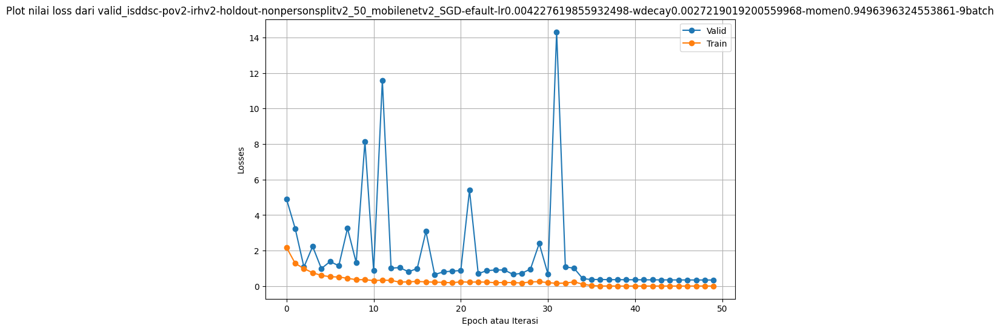

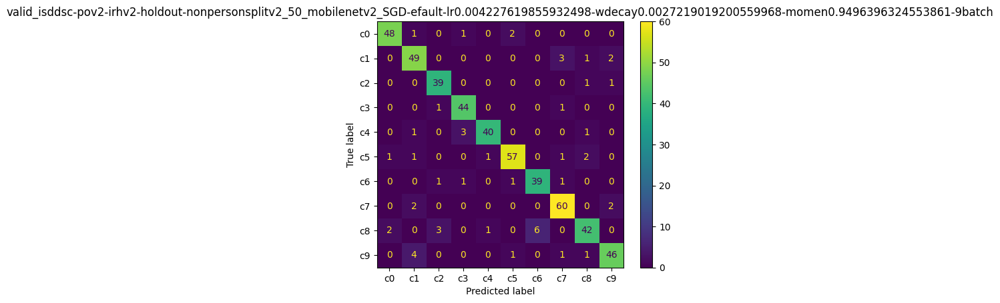

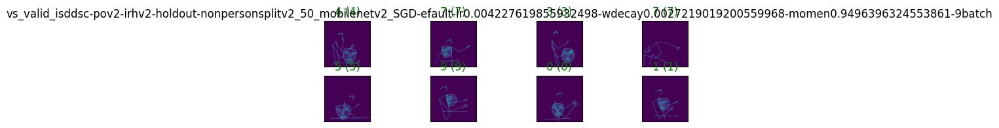

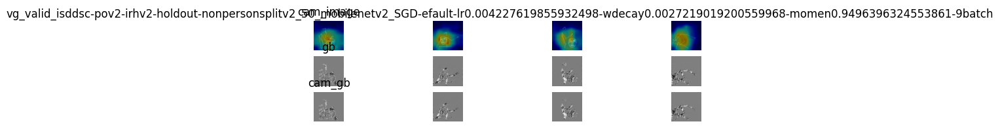

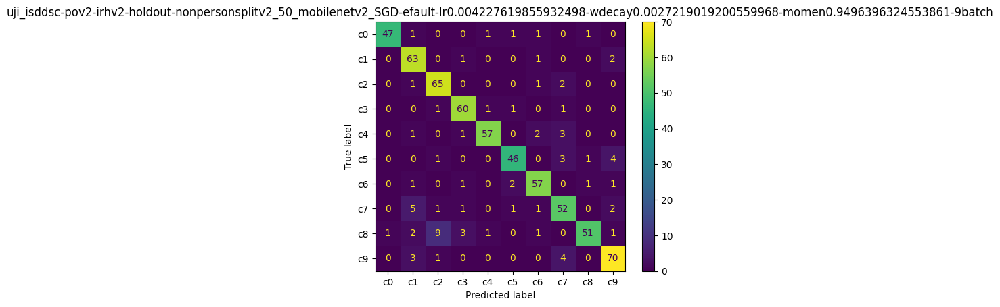

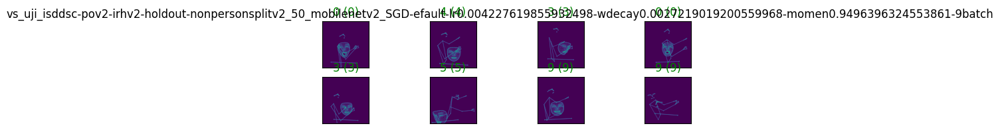

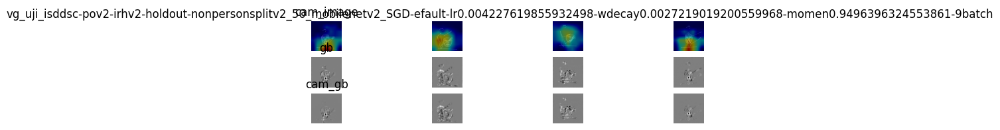

In [21]:
# name_file = f"kmu_fed_kfold{n_splits}.{fi}.{epochs}_mobilenetv2_v0.3"
name_model = "mobilenetv2"
# model = MobileNetV2_CBAM_hilmi(10)
model = MobileNetV2(num_classes=10, color_channel=2)
str_to_num=False
save_path = f"../hasil/mobilenetv2"

# path_dir = "../resources"
# name_data = "isdds90c_irhv2_holdout_nonpersonsplitv2"
# path = path_dir+"/isdds_skeleton/90c_v2"
# dataset_list = [path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/latih_isdds90c_irhv2.csv",
#                 path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/valid_isdds90c_irhv2.csv",
#                 path_dir+"/isdds_irhv2_nonpersonsplitv2_holdout/uji_isdds90c_irhv2.csv",]


criterion = nn.CrossEntropyLoss()

optim_params = {'lr': 0.004227619855932498,
                'weight_decay': 0.0027219019200559968,
                'momentum': 0.9496396324553861}
optimizer = optim.SGD #Adam
# scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=5, factor=0.5)

patience = 15#30
# counter = 0

# n_splits=5
epochs=50        #50#250#20
batch_size= 9  #8#64#32

# versi = "Adam-default-outchan1280-20batch" #X, coba lr0.001
versi = "SGD-efault-lr0.004227619855932498-wdecay0.0027219019200559968-momen0.9496396324553861-9batch" #X, coba lr0.001

workflow.run_workflow(
    versi=versi, model=model, str_to_num=str_to_num,
    # init_model=init_mobilenetv2(),
    # dataset_const=dataset,
    batch_size=batch_size,
    # n_splits=n_splits,
    epochs=epochs,
    patience=patience,
    # class_names=class_names,
    path='path',
    name_model=name_model,
    name_data=name_data,
    save_path0=save_path,
    criterion_const=criterion,
    optim_const=optimizer, optim_params=optim_params,
    transform_train=transform_train, transform_test=transform_test,
    # dataset_list=None,
    dataset_list2=dataset_list2,
    use_pov2=True,
)
